<a href="https://www.kaggle.com/code/minervasdatalab/rag-n-geospatial-data-for-site-identification?scriptVersionId=247393616" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/different-archaeological-types/filtered_points.csv
/kaggle/input/elevation/SRTM_Elevation_Amazon.tif
/kaggle/input/floodplains/SA_Updated.tif
/kaggle/input/amazon-basin-rivers/amzrivnet_v.shx
/kaggle/input/amazon-basin-rivers/amzrivnet_v.prj
/kaggle/input/amazon-basin-rivers/amzrivnet_v.sbn
/kaggle/input/amazon-basin-rivers/amzrivnet_v.dbf
/kaggle/input/amazon-basin-rivers/amzrivnet_v.sbx
/kaggle/input/amazon-basin-rivers/amzrivnet_v.shp
/kaggle/input/amazonpeerj/amazon_peerj.jpg
/kaggle/input/srtmdem/SA_srtm_mosaic_30arcsec_reg_hgt.tif
/kaggle/input/predictors-nodem/processed_environmental_stack.tif
/kaggle/input/amazontrees/treerich1.tif
/kaggle/input/s2-amazon-bands/s2_2024.tif
/kaggle/input/openai-to-z-challenge/README
/kaggle/input/brazilnut-sdm/mergedBrazilNut_sdm.tif
/kaggle/input/gee-derived-soil-variables/clay_b0.tif
/kaggle/input/gee-derived-soil-variables/ph_b0.tif
/kaggle/input/gee-derived-soil-variables/soc_b0.tif
/kaggle/input/gee-derived-soil-variables/txt_

# Problem Statement: Identifying Potential Archaeological Sites in the Amazon Region Using Remote Sensing, Geospatial Data, OpenAI for Clustering, and a RAG Model for Literature Synthesis and Validation

### Overview:
The Amazon basin is home to rich, yet hidden, archaeological features, such as geoglyphs and other ancient settlements. However, these sites are often difficult to discover and preserve due to the dense forest cover, remote location, and lack of reliable surveying methods. This problem utilizes remote sensing data, environmental variables, machine learning clustering techniques, and advanced AI models to identify areas in the Amazon most likely to contain unknown archaeological sites based on the environmental patterns of known sites.

Additionally, Open AI GPT 4 model has been used to verify the results and develop a RAG model (Retrieval-Augmented Generation) to assist in literature synthesis. This model combines the strengths of retrieval-based search and generative AI to synthesize existing archaeological research and compare it with findings from the analysis.The RAG model can retrieve relevant literature (research papers, reports, surveys) from databases or repositories, then generate summaries and insights from those documents. This allows for context-aware recommendations and verification of identified potential sites based on previous archaeological findings.

#### Archaeological Data Sources

The Amazon basin is the home to several different archeological types. These include everything from ceremonial mounds to geoglyphs. The geoglyphs constitute real estate and are monumental earthen constructions related to an important period in the history of Brazil's occupation of the West Amazon by a group that built hundreds of enclosures surrounded by ditches and low walls in geometric shapes.

The geolocational data for geoglyphs was obtained from peer reviewed literature: https://hal.science/hal-02567741/document and https://www.pnas.org/doi/epdf/10.1073/pnas.1614577114 and https://jqjacobs.net/archaeology/geoglyph.html . The other arcaheological object types were ontained from- (a) PeerJ: https://peerj.com/articles/15137/ (b) https://jqjacobs.net/archaeology/geoglyph.html

In [2]:
import pandas as pd

In [3]:
points=pd.read_csv('/kaggle/input/different-archaeological-types/filtered_points.csv')

In [4]:
points.head()

,Id,type,POINT_X,POINT_Y
0,0,large platform mounds,-64.357915,-15.000864
1,1,large platform mounds,-64.774797,-14.983732
2,2,large platform mounds,-64.286531,-15.294966
3,3,large platform mounds,-64.343638,-15.172186
4,4,large platform mounds,-64.797639,-15.166475


In [ ]:
points.tail()

#### Study site- Amazon basin

In [5]:
import os
import requests

# Define the base URL and filenames
base_url = "https://raw.githubusercontent.com/gamamo/AmazonBasinLimits/master/"
filenames = [
    "amazon_sensulatissimo_gmm_v1.shp",
    "amazon_sensulatissimo_gmm_v1.shx",
    "amazon_sensulatissimo_gmm_v1.dbf",
    "amazon_sensulatissimo_gmm_v1.prj"
]

# Create a directory to store the shapefile components
os.makedirs("amazon_basin_shapefile", exist_ok=True)

# Download each file
for filename in filenames:
    url = base_url + filename
    response = requests.get(url)
    if response.status_code == 200:
        with open(os.path.join("amazon_basin_shapefile", filename), "wb") as f:
            f.write(response.content)
        print(f"Downloaded {filename}")
    else:
        print(f"Failed to download {filename}")


Downloaded amazon_sensulatissimo_gmm_v1.shp
Downloaded amazon_sensulatissimo_gmm_v1.shx
Downloaded amazon_sensulatissimo_gmm_v1.dbf
Downloaded amazon_sensulatissimo_gmm_v1.prj


In [6]:
import geopandas as gpd

# Define the path to the .shp file
shapefile_path = "amazon_basin_shapefile/amazon_sensulatissimo_gmm_v1.shp"

# Read the shapefile
gdf = gpd.read_file(shapefile_path)

# Display the first few rows
gdf.head()


,Id,area,geometry
0,0,0.46,"POLYGON ((-64.37961 -20.20885, -64.38048 -20.2..."
1,0,0.53,"POLYGON ((-64.38048 -20.20210, -64.38372 -20.2..."
2,0,0.01,"POLYGON ((-77.90818 0.20184, -77.90818 0.20762..."
3,0,0.78,"POLYGON ((-77.80988 0.31769, -77.80823 0.32050..."
4,0,0.29,"POLYGON ((-77.77430 0.40472, -77.77399 0.40869..."


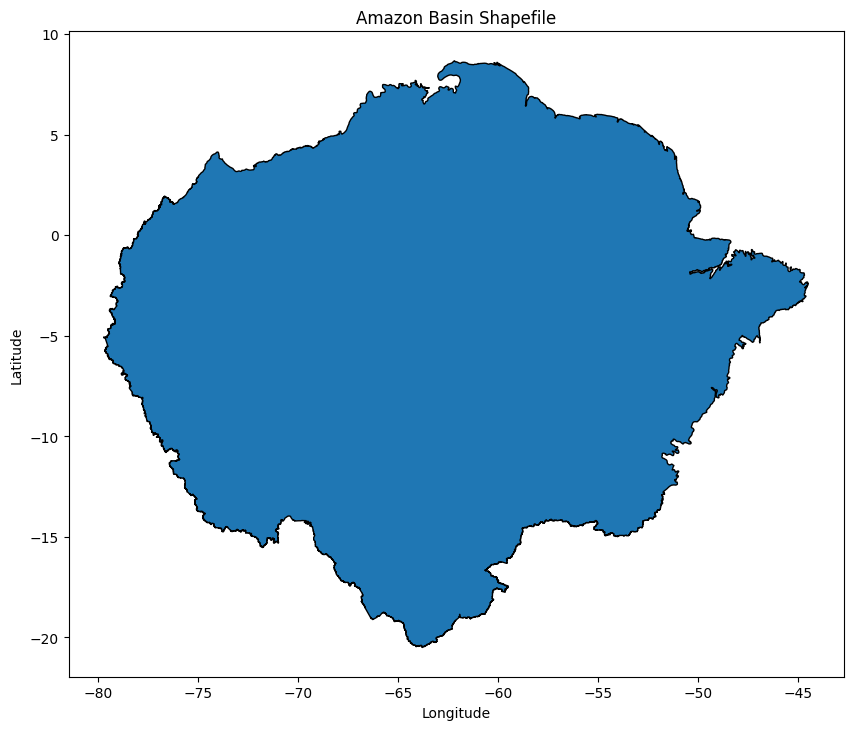

In [7]:
import matplotlib.pyplot as plt

# Plot the GeoDataFrame
gdf.plot(figsize=(10, 10), edgecolor='black')
plt.title("Amazon Basin Shapefile")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [8]:
import geopandas as gpd
from shapely.geometry import Point

# Convert to geometry column
points['geometry'] = points.apply(lambda row: Point(row['POINT_X'], row['POINT_Y']), axis=1)

# Create GeoDataFrame with appropriate CRS
points_gdf = gpd.GeoDataFrame(points, geometry='geometry', crs='EPSG:4326')  # or match gdf.crs


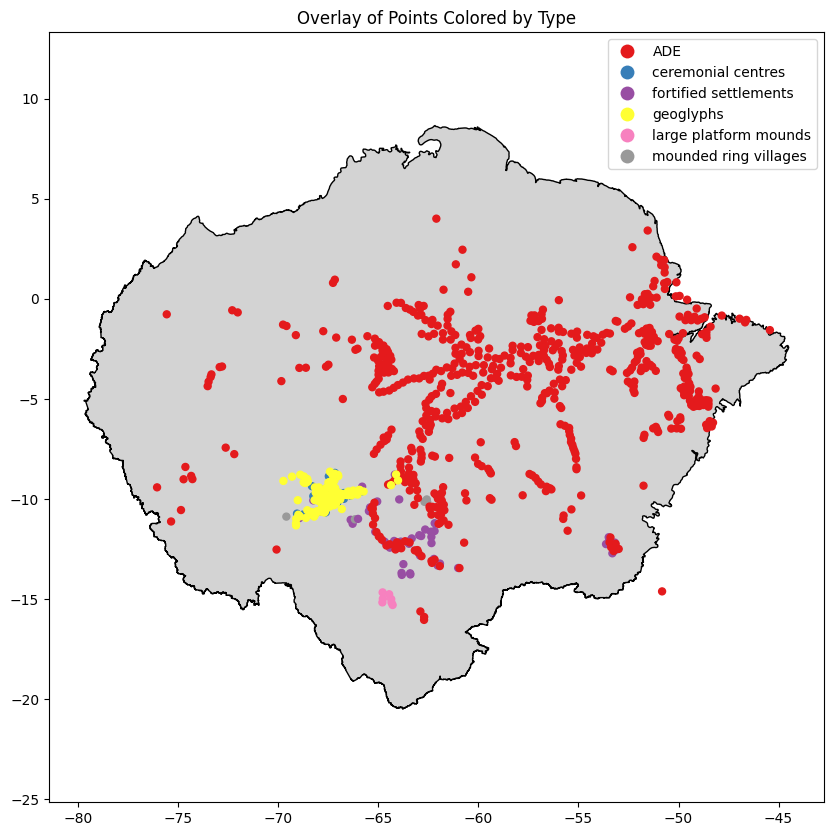

In [9]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))

# Plot base map (e.g. polygons or rasters)
gdf.plot(ax=ax, color='lightgrey', edgecolor='black')

# Overlay points, colored by 'type'
points_gdf.plot(ax=ax, column='type', legend=True, cmap='Set1', markersize=25)

# Final touches
ax.set_title("Overlay of Points Colored by Type")
plt.axis('equal')
plt.show()


#### Geospatial Data Sources

These can be found on Github- https://github.com/Jojo666/openai-to-z-challenge/tree/main/datasources 


**Rivers**: LBA-ECO CD-06 Amazon River Basin Land and Stream Drainage Direction Maps (https://daac.ornl.gov/LBA/guides/CD06_CAMREX.html)

**Brazil nut habitat suitability model**: Species distribution model (/kaggle/input/brazilnut-sdm/mergedBrazilNut_sdm.tif) was modelled using a combination of topographic and bioclimatic variables to identify the most suitable habitats for the brazil nut tree. Presence of the Brazil nut tree is associated with the presence of pre-Colimbian archaeological sites. The actual Brazil nut SDM modelling can be found here- https://github.com/Jojo666/openai-to-z-challenge/blob/main/draft_scripts/brazilNut_sdm2.ipynb

**Bioclimatic variables**- Bioclimatic variables (provided by WorldClim) are derived from the monthly temperature and rainfall values in order to generate more biologically meaningful variables. These are often used in species distribution modeling and related ecological modeling techniques. The bioclimatic variables represent annual trends (e.g., mean annual temperature, annual precipitation) seasonality (e.g., annual range in temperature and precipitation) and extreme or limiting environmental factors (e.g., temperature of the coldest and warmest month, and precipitation of the wet and dry quarters). A quarter is a period of three months (1/4 of the year).

**Soil variables**- Soil attrributes including texture, pH, clay content and soil organic carbon were extracted via Google Earth Engine (GEE) along bioclimatic variables via- https://github.com/Jojo666/openai-to-z-challenge/blob/main/draft_scripts/exportgeedata.py 

**Tree species richness**- Higher tree species richness is associated with the presence of previous civilizations. The data for these were obtained from- https://www.nature.com/articles/s42003-023-05514-6

**Floodplains**- The GFPLAIN250m includes raster data of Earth's floodplains identified using a geomorphic approach. They are associated with the presence of ancient human habitation (https://figshare.com/articles/dataset/GFPLAIN250m/6665165/1). 


**Basic Literature Querying- RAG**

The literature used in this RAG can be found here- https://github.com/Jojo666/openai-to-z-challenge/tree/main/literature

In [34]:
!git clone https://github.com/Jojo666/openai-to-z-challenge.git
pdf_dir = "openai-to-z-challenge/literature"

Cloning into 'openai-to-z-challenge'...
remote: Enumerating objects: 153, done.
remote: Counting objects: 100% (153/153), done.
remote: Compressing objects: 100% (146/146), done.
remote: Total 153 (delta 67), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (153/153), 102.98 MiB | 20.41 MiB/s, done.
Resolving deltas: 100% (67/67), done.


In [30]:

!pip install -U pymupdf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 29.5 MB/s eta 0:00:0000:0100:01


In [31]:
import fitz  # This now works because pymupdf exposes itself as 'fitz'
import os

def extract_text_from_pdfs(pdf_folder):
    docs = []
    for file in os.listdir(pdf_folder):
        if file.endswith(".pdf"):
            path = os.path.join(pdf_folder, file)
            with fitz.open(path) as doc:
                text = "\n".join(page.get_text() for page in doc)
                docs.append({"filename": file, "text": text})
    return docs


In [32]:
!pip install -U langchain faiss-cpu openai langchain-openai langchain_community langchain_core

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.3/31.3 MB 40.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.2/69.2 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 62.9 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.9/438.9 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.7/367.7 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.2/45.2 kB 2.3 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 25.0
    Uninstalling packaging-25.0:
      Successfully uninstalled packaging-25.0
  Attempting uninstall: langsmith
    Found existing installation: langsmith 0.3.23
    Uninstalling langsmith-0.3.23:
      Successfully uninstalled langsmith-0.3.23
  Attempting uni

In [35]:
documents = extract_text_from_pdfs(pdf_dir)

Split text into chunks for embedding

In [36]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

splitter = RecursiveCharacterTextSplitter(chunk_size=500, chunk_overlap=50)
texts = []
metas = []

for doc in documents:
    chunks = splitter.split_text(doc["text"])
    texts.extend(chunks)
    metas.extend([{"source": doc["filename"]}] * len(chunks))

Embed and index chunks (use FAISS or ChromaDB)

In [37]:
!pip install --upgrade openai

In [38]:
import openai

In [39]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("OpenAI")

In [40]:
import os
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Access OpenAI key from Kaggle Secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")  # "OpenAI" should be the secret label

# Create OpenAI client
client = OpenAI(api_key=openai_key)

In [41]:
!pip install faiss-cpu

In [42]:
from langchain_openai import OpenAIEmbeddings
from langchain_community.vectorstores import FAISS

# Replace with your actual key
# Initialize OpenAIEmbeddings using the key retrieved from Kaggle Secrets
embedding_model = OpenAIEmbeddings(openai_api_key=openai_key)

vectorstore = FAISS.from_texts(texts, embedding_model, metadatas=metas)

In [43]:
from langchain_openai import ChatOpenAI
from langchain.chains import RetrievalQA


In [44]:
# Initialize ChatOpenAI using the key retrieved from Kaggle Secrets
llm = ChatOpenAI(model_name="gpt-4", openai_api_key=openai_key)

In [45]:
retriever = vectorstore.as_retriever(search_kwargs={"k": 5})
qa_chain = RetrievalQA.from_chain_type(llm=llm, retriever=retriever)

response1 = qa_chain.run("Summarize findings about Amazonian archeological sites.")
print(response1)

/tmp/ipykernel_35/725683449.py:4: LangChainDeprecationWarning: The method `Chain.run` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  response1 = qa_chain.run("Summarize findings about Amazonian archeological sites.")


The study includes locations for Amazonian archaeological sites from recent compilations, totaling 510 ADEs, 1,100 earthworks, and 422 other archaeological sites. Earthwork sites are visible in satellite imagery and the study found 24 unreported earthworks in various areas of Amazonia, including a fortified village in southern Amazonia, defensive and ceremonial sites in southwestern Amazonia, crowned mountains and megalithic structures in the Guiana Shield, and riverine sites on floodplains in central Amazonia. An additional study was focused on the Peruvian Amazon, showing that indigenous people did not live in isolated villages. Despite the cessation of Geoglyph construction in Amazonia around AD 950, the area was not abandoned but occupied by a flourishing regional system of Mound Villages, questioning the traditional views that portray the western sector of Amazonia as sparsely inhabited.


In [46]:
response2 = qa_chain.run("Summarize findings about Amazonian geoglyphs.")
print(response2)

The Amazonian geoglyphs are large earthworks that were concealed for centuries under Amazonian rainforests, directly challenging the idea that this ecosystem was pristine and vulnerable to human impacts. Evidence suggests that these geoglyphs were built and used sporadically as ceremonial and public gathering sites between 2000 and 650 calibrated years before present, but some may have been constructed as early as 3500-3000 BP. Despite the cessation of Geoglyph construction around AD 950, this region of southwestern Amazonia wasn't abandoned but was occupied by a regional system of Mound Villages. This evidence challenges traditional beliefs that portray interfluvial areas and the western sector of Amazonia as sparsely inhabited. Instead, it suggests denser populations and more significant human impacts on the landscape than previously thought.


In [47]:
response2b = qa_chain.run("Is there any connection between Amazonian archaeological sites and bamboos")
print(response2b)

Yes, there is a connection between Amazonian archaeological sites and bamboos. The texts suggest that bamboo-dominated forests were present around pre-Columbian earthwork formations in southwestern Amazonia. These earthworks were a key discovery in Amazonian archaeology.


**A more dynamic literature retrieval**

In [48]:
from langchain_openai import OpenAIEmbeddings
from langchain.vectorstores import FAISS
from langchain.chains import RetrievalQA
from langchain_openai.chat_models import ChatOpenAI

In [49]:
def convert_to_documents(papers):
    docs = []
    for paper in papers:
        content = paper.get("abstract", "No abstract available")
        metadata = {
            "title": paper["title"],
            "year": paper.get("year"),
            "url": paper.get("url") or paper.get("openAccessPdf", {}).get("url"),
            "authors": [a["name"] for a in paper.get("authors", [])]
        }
        if content:
            docs.append({"content": content, "metadata": metadata})
    return docs


In [50]:
from langchain.schema import Document

def to_langchain_docs(docs):
    return [
        Document(page_content=d["content"], metadata=d["metadata"])
        for d in docs
    ]

In [51]:
import requests

def search_semantic_scholar(query, limit=10):
    url = "https://api.semanticscholar.org/graph/v1/paper/search"
    params = {
        "query": query,
        "limit": limit,
        "fields": "title,authors,year,abstract"
    }

    try:
        response = requests.get(url, params=params, timeout=10)
        print("Response status:", response.status_code)

        if response.status_code == 200:
            data = response.json()
            return data
        else:
            print(f"Error: Received status code {response.status_code}")
            print("Response text:", response.text)
            return None

    except requests.exceptions.Timeout:
        print("Error: Request timed out.")
    except requests.exceptions.ConnectionError:
        print("Error: Connection error occurred.")
    except requests.exceptions.HTTPError as http_err:
        print(f"HTTP error occurred: {http_err}")
    except requests.exceptions.RequestException as e:
        print(f"An error occurred: {e}")

    return None

In [52]:
def create_vector_store(documents):
    embeddings = OpenAIEmbeddings()
    vectorstore = FAISS.from_documents(documents, embedding=embeddings)
    return vectorstore

In [ ]:
#query = "Amazon LiDAR archaeology Sentinel"

In [53]:
import requests
import os
from time import sleep
from kaggle_secrets import UserSecretsClient
from langchain_core.documents import Document
from langchain_openai import OpenAIEmbeddings, ChatOpenAI
from langchain.vectorstores import FAISS
from langchain.chains import RetrievalQA

# ===== Configuration =====
MAX_RESULTS = 20  # Maximum papers to fetch
SEMANTIC_SCHOLAR_DELAY = 3  # Seconds between API calls
RETRY_DELAY = 10  # Seconds to wait if rate limited
MAX_ATTEMPTS = 2  # Maximum retry attempts

# ===== Helper Functions =====
def search_semantic_scholar(query, limit=10):
    """Search Semantic Scholar with rate limit handling"""
    url = f"https://api.semanticscholar.org/graph/v1/paper/search?query={query}&limit={limit}&fields=title,abstract,authors,year,url"
    try:
        sleep(SEMANTIC_SCHOLAR_DELAY)
        response = requests.get(url)
        if response.status_code == 429:
            print(f"Rate limited. Waiting {RETRY_DELAY} seconds...")
            sleep(RETRY_DELAY)
            return None
        response.raise_for_status()
        return response.json()
    except requests.exceptions.RequestException as e:
        print(f"API Error: {str(e)}")
        return None

def create_documents(papers):
    """Convert API results to LangChain Documents with safe metadata handling"""
    documents = []
    for paper in papers:
        # Safely extract all fields with defaults
        metadata = {
            'title': paper.get('title', 'Untitled'),
            'authors': ', '.join([a.get('name', 'Unknown') for a in paper.get('authors', [])]),
            'year': str(paper.get('year', 'Unknown year')),
            'url': paper.get('url', 'No URL available')
        }
        
        documents.append(Document(
            page_content=f"Title: {metadata['title']}\nAbstract: {paper.get('abstract', 'No abstract available')}",
            metadata=metadata
        ))
    return documents

def display_results(answer, sources):
    """Format and display the QA results"""
    print("\n=== ANSWER ===")
    print(answer)
    
    if sources:
        print("\n=== SOURCES ===")
        for i, doc in enumerate(sources, 1):
            meta = doc.metadata
            print(f"{i}. {meta['title']} ({meta['year']})")
            print(f"   Authors: {meta['authors']}")
            print(f"   URL: {meta['url']}\n")

# ===== Main Pipeline =====
def run_pipeline(query):
    """Execute the full RAG pipeline"""
    # Load API keys
    user_secrets = UserSecretsClient()
    os.environ["OPENAI_API_KEY"] = user_secrets.get_secret("OpenAI")
    
    if not os.environ["OPENAI_API_KEY"]:
        print("Error: OpenAI API key not found in Kaggle Secrets")
        return
    
    # Try multiple times if rate limited
    results = None
    for attempt in range(MAX_ATTEMPTS):
        results = search_semantic_scholar(query, limit=MAX_RESULTS)
        if results:
            break
        sleep(RETRY_DELAY)
    
    if not results:
        print("Failed to get results after multiple attempts. Please try again later.")
        return
    
    if not results.get('data'):
        print("No papers found for this query")
        return
    
    # Process papers
    papers = results['data'][:MAX_RESULTS]
    documents = create_documents(papers)
    
    # Create vector store
    embeddings = OpenAIEmbeddings()
    vectorstore = FAISS.from_documents(documents, embeddings)
    
    # Create QA chain
    qa_chain = RetrievalQA.from_chain_type(
        llm=ChatOpenAI(model="gpt-4", temperature=0.3),
        retriever=vectorstore.as_retriever(search_kwargs={"k": min(3, len(documents))}),
        return_source_documents=True
    )
    
    # Get answer
    response = qa_chain.invoke({"query": query})
    display_results(response['result'], response['source_documents'])

# ===== Execution =====
if __name__ == "__main__":
    query2 = "Amazon elevation archaeology geoglyphs"
    run_pipeline(query2)


=== ANSWER ===
The detection of pre-Colombian geoglyphs, which are geometric structures outlined by trenches or walls, in the Amazon is often done using airborne LiDAR data. This method involves visual observation of the variation in elevation and commonly uses additional hillshading. However, this can be time-consuming and inaccurate due to the need to constantly adjust the contrasts of the elevation image or the parameter of the hillshading function. A method has been developed to enhance the anomaly of the terrain without using focal operations to normalize the elevation of each pixel in relation to its neighbors. This normalization removes the influence of the landscape mean elevation and highlights the fine anomaly of the terrain, allowing for a fast visual assessment of relief anomaly and the presence of geoglyphs in large LiDAR datasets.

=== SOURCES ===
1. What do paleoecological data tell us about the Amazon Anthropocene? (2024)
   Authors: Jennifer Watling, S. Y. Maezumi, My

**Reported Findings**


**Summary of Archaeological Type Discovery Framework:**

I developed a hybrid geospatial framework combining unsupervised clustering, supervised classification, and LLM-guided reasoning to explore likely regions of undiscovered geoglyphs in the Amazon. First, we compiled a multi-band environmental raster stack (BIOCLIM, soil, Brazil nut suitability, etc.) 

TBC


# **Read and process the geospatial raster data**

The geospatial rasters listed above all had different extents and resolutions. They were processed and stacked together into a final predictor raster stack (final_environmental_stack.tif) in this script: https://www.kaggle.com/code/minervasdatalab/bandprocess

In [10]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 63.3 MB/s eta 0:00:00:00:0100:01


In [ ]:

#import rasterio

# Path to the .tif file in Kaggle input
#raster_path = '/kaggle/input/predictors-nodem/processed_environmental_stack.tif'

# Open the .tif file using rasterio
#with rasterio.open(raster_path) as src:
    # Read the raster data (you can specify which band to read if you have multiple bands)
   # data = src.read(1)  # Read the first band (if it's a multi-band raster, adjust accordingly)
    
    # Get metadata about the raster (CRS, transform, etc.)
   # meta = src.meta

# Print the shape and metadata to confirm it's read properly
#print("Data shape:", data.shape)
#print("Metadata:", meta)

# Optionally, visualize the raster data (if it's a 2D array)
#import matplotlib.pyplot as plt

#plt.figure(figsize=(10, 7))
#plt.imshow(data, cmap='viridis')  # Adjust the colormap as needed
#plt.colorbar()
#plt.title("Visualized Raster Data")
#plt.axis("off")
#plt.show()


In [11]:
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt



Successfully created final stack with:
- Original 14 environmental bands
- Elevation (range: -47.0m to 6255.4m)
- Slope (range: 0.0° to 90.0°)
- Floodplains (values: [0. 1.])


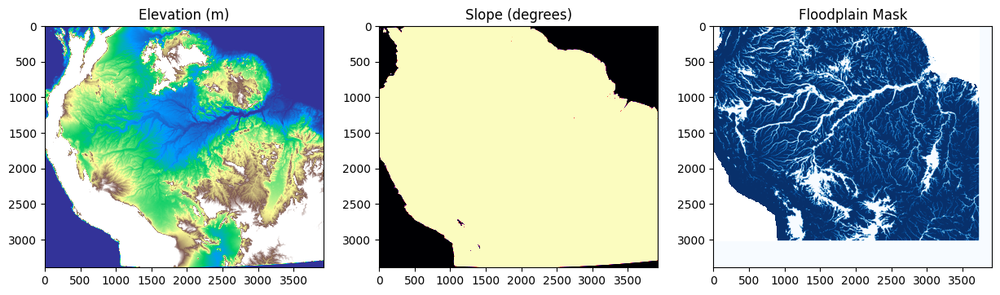

In [12]:
import rasterio
import numpy as np
from rasterio.warp import reproject, Resampling
from scipy.ndimage import sobel
import warnings
from rasterio.windows import from_bounds

# Suppress runtime warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# 1. Load existing stack
with rasterio.open('/kaggle/input/predictors-nodem/processed_environmental_stack.tif') as src:
    stack = src.read()
    profile = src.profile.copy()  # Create a copy to modify
    band_names = list(src.descriptions)
    transform = src.transform
    pixel_size = transform[0]  # Assumes square pixels
    height, width = src.shape
    stack_bounds = src.bounds  # Get bounds for floodplain clipping

# 2. Process elevation data
with rasterio.open('/kaggle/input/elevation/SRTM_Elevation_Amazon.tif') as elev_src:
    elevation = np.empty((height, width), dtype=np.float32)
    reproject(
        source=elev_src.read(1),
        destination=elevation,
        src_transform=elev_src.transform,
        src_crs=elev_src.crs,
        dst_transform=transform,
        dst_crs=profile['crs'],
        resampling=Resampling.bilinear
    )
    
    # Compute slope
    dx = sobel(elevation, axis=1) / (8 * pixel_size)
    dy = sobel(elevation, axis=0) / (8 * pixel_size)
    slope = np.degrees(np.arctan(np.sqrt(dx**2 + dy**2)))

# 3. Process floodplain data (new addition)
with rasterio.open('/kaggle/input/floodplains/SA_Updated.tif') as flood_src:
    # Create window for reading just our area of interest
    window = from_bounds(*stack_bounds, transform=flood_src.transform)
    
    # Read and reproject floodplain data
    floodplains = np.empty((height, width), dtype=np.float32)
    reproject(
        source=flood_src.read(1, window=window, boundless=True),
        destination=floodplains,
        src_transform=flood_src.transform,
        src_crs=flood_src.crs,
        dst_transform=transform,
        dst_crs=profile['crs'],
        resampling=Resampling.mode  # Best for categorical data
    )
    floodplains = np.where(floodplains == flood_src.nodata, np.nan, floodplains)

# 4. Combine all bands
enhanced_stack = np.concatenate([
    stack,  # Original bands
    elevation[np.newaxis, ...],  # Elevation
    slope[np.newaxis, ...],  # Slope
    floodplains[np.newaxis, ...]  # Floodplains
], axis=0)

# 5. Update metadata
profile.update({
    'count': enhanced_stack.shape[0],
    'dtype': 'float32',
    'nodata': -9999  # Standardize nodata value
})
new_band_names = band_names + ['elevation', 'slope_degrees', 'floodplain_mask']

# 6. Save final stack
with rasterio.open('/kaggle/working/final_environmental_stack.tif', 'w', **profile) as dst:
    dst.write(enhanced_stack)
    for i, name in enumerate(new_band_names, 1):
        dst.set_band_description(i, name)

# Verification
print("\nSuccessfully created final stack with:")
print(f"- Original {len(band_names)} environmental bands")
print(f"- Elevation (range: {elevation.min():.1f}m to {elevation.max():.1f}m)")
print(f"- Slope (range: {slope.min():.1f}° to {slope.max():.1f}°)")
print(f"- Floodplains (values: {np.unique(floodplains[~np.isnan(floodplains)])})")

# Visual check
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.imshow(elevation, cmap='terrain', vmin=0, vmax=500)
plt.title('Elevation (m)')
plt.subplot(132)
plt.imshow(slope, cmap='magma', vmin=0, vmax=30)
plt.title('Slope (degrees)')
plt.subplot(133)
plt.imshow(floodplains, cmap='Blues')
plt.title('Floodplain Mask')
plt.show()

In [13]:
import rasterio

# Open the final stack
with rasterio.open('/kaggle/working/final_environmental_stack.tif') as src:
    # Get all band descriptions
    band_names = src.descriptions
    
    # Print with band numbers
    print("Band # | Band Name")
    print("-------|----------")
    for i, name in enumerate(band_names, 1):
        print(f"{i:6} | {name}")

Band # | Band Name
-------|----------
     1 | bio04_temperature_seasonality
     2 | bio19_precipitation_coldest_quarter
     3 | bio07_temperature_annual_range
     4 | bio18_precipitation_warmest_quarter
     5 | bio03_isothermality
     6 | bio05_max_temp_warmest_month
     7 | bio02_mean_diurnal_range
     8 | bio15_precipitation_seasonality
     9 | soil_clay_content
    10 | soil_ph
    11 | soil_organic_carbon
    12 | soil_texture
    13 | brazilnut_sdm
    14 | tree_species_richness
    15 | elevation
    16 | slope_degrees
    17 | floodplain_mask


In [14]:
from scipy.ndimage import distance_transform_edt

with rasterio.open('/kaggle/working/final_environmental_stack.tif') as src:
    floodplain = src.read(src.descriptions.index('floodplain_mask')+1)
    dist_to_floodplain = distance_transform_edt(~(floodplain == 1)) * src.res[0]  # In meters

In [ ]:
#import os
#import zipfile
#import rasterio
#from osgeo import gdal

# 1. Save the final stack (with all bands)
#with rasterio.open('/kaggle/working/final_environmental_stack.tif', 'w', **profile) as dst:
   # dst.write(enhanced_stack)
   # for i, name in enumerate(new_band_names, 1):
   #     dst.set_band_description(i, name)

# 2. Create compressed version
#!gdal_translate -co "COMPRESS=LZW" -co "TILED=YES" \
#  /kaggle/working/final_environmental_stack.tif \
#  /kaggle/working/final_stack_compressed.tif

# 3. Package both versions
#output_files = [
#    '/kaggle/working/final_environmental_stack.tif',
#    '/kaggle/working/final_stack_compressed.tif'
#]

# 4. Create zip archive
#zip_path = '/kaggle/working/archaeology_stack.zip'
#with zipfile.ZipFile(zip_path, 'w') as zipf:
   # for f in output_files:
   #     if os.path.exists(f):
   #         arcname = os.path.basename(f)
   #         zipf.write(f, arcname=arcname)
   #         print(f"Added {arcname} ({os.path.getsize(f)/1024/1024:.1f} MB)")
   #     else:
   #         print(f"Warning: {f} not found")

# 5. Generate download link
#from IPython.display import FileLink
#print("\nDownload your stack:")
#FileLink(zip_path)

# 6. Verification
#print("\nFinal stack contains these bands:")
#for i, name in enumerate(new_band_names, 1):
##    print(f"{i}. {name}")

#print("\nTo use in future notebooks:")
#print(f"Path: '/kaggle/input/YOUR_DATASET_NAME/{os.path.basename(output_files[0])}'")

**Let's examine our raster data and the archeological types**

In [54]:
import rasterio
import matplotlib.pyplot as plt
import geopandas as gpd

# Define band names (in order)
band_names = [
    "bio04_temperature_seasonality",
    "soil_clay_content",
    "brazilnut_sdm",
    "tree_species_richness",
    "elevation",
    "floodplain_mask"
]

# Open the raster
raster_path = "/kaggle/working/final_environmental_stack.tif"
src = rasterio.open(raster_path)


In [55]:
# Reproject points to raster CRS
points_gdf = points_gdf.to_crs(src.crs)


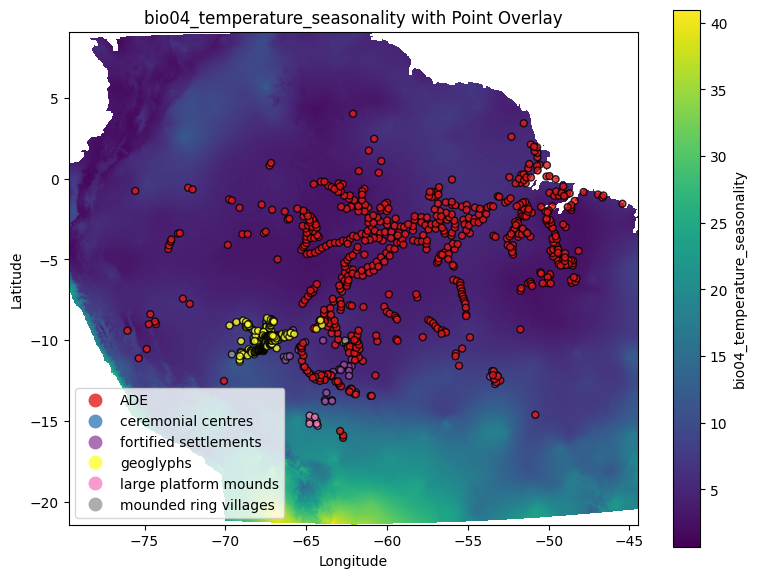

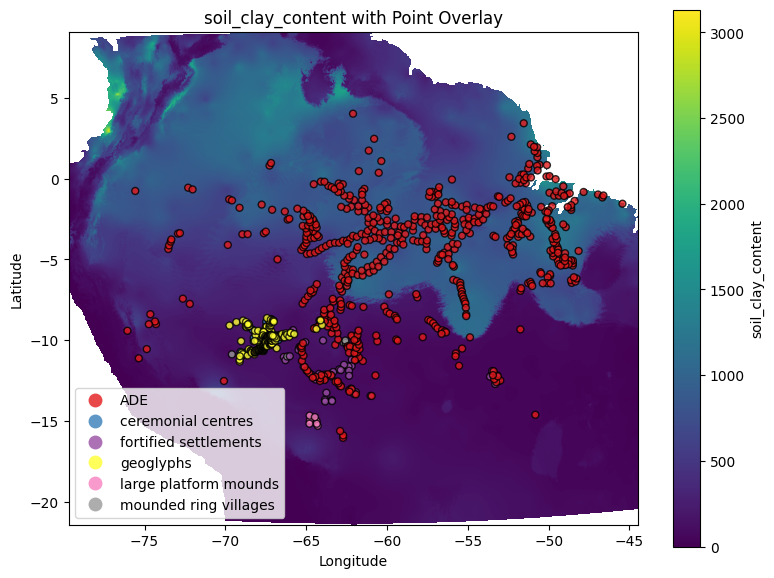

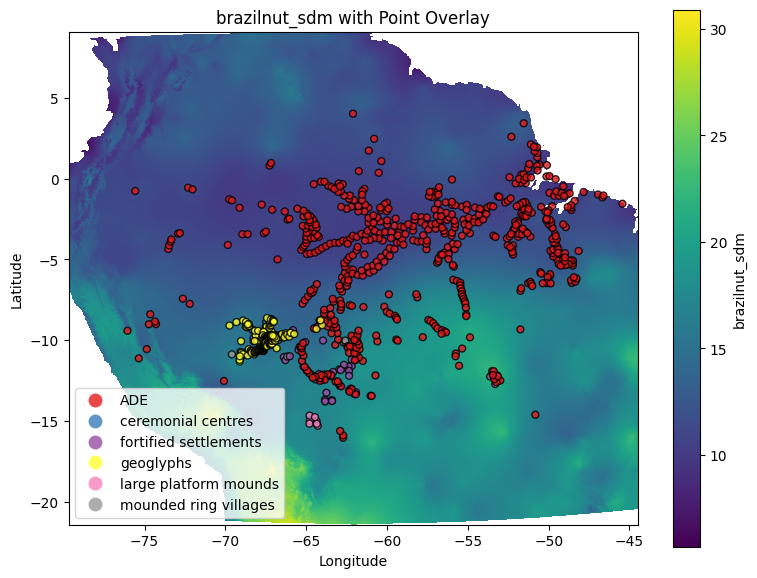

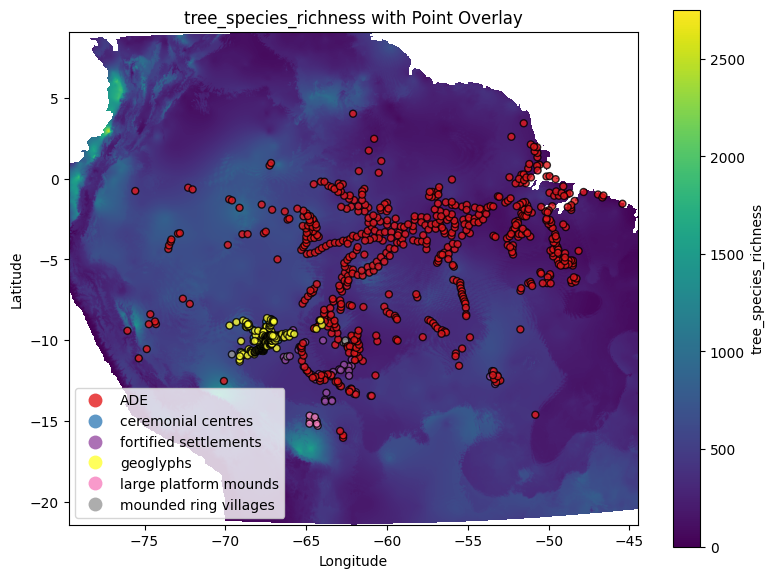

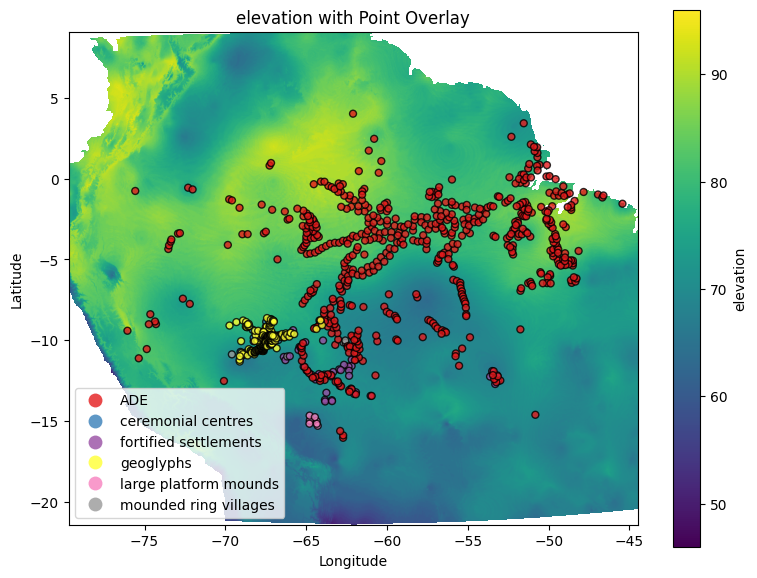

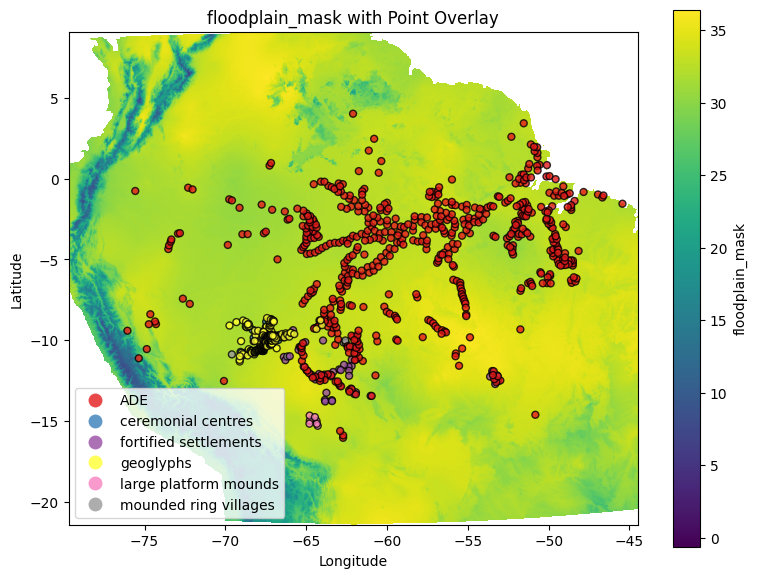

In [17]:
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Define band names in correct order
band_names = [
    "bio04_temperature_seasonality",
    "soil_clay_content",
    "brazilnut_sdm",
    "tree_species_richness",
    "elevation",
    "floodplain_mask"
]

# Load raster
raster_path = "/kaggle/working/final_environmental_stack.tif"
src = rasterio.open(raster_path)

# Reproject points to match raster CRS
points_gdf = points_gdf.to_crs(src.crs)

# Visualization loop for matching band count and names
for i in range(1, min(src.count, len(band_names)) + 1):
    band = src.read(i)
    band_name = band_names[i - 1]
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Show raster band with georeferenced extent
    raster_plot = ax.imshow(
        band,
        cmap='viridis',
        norm=Normalize(vmin=np.nanmin(band), vmax=np.nanmax(band)),
        extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    )
    
    # Overlay points, colored by type
    points_gdf.plot(
        ax=ax,
        column='type',
        cmap='Set1',
        markersize=25,
        legend=True,
        alpha=0.8,
        edgecolor='black'
    )
    
    ax.set_title(f"{band_name} with Point Overlay")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_aspect('equal')
    plt.colorbar(raster_plot, ax=ax, label=band_name)
    plt.tight_layout()
    plt.show()


In [18]:
import geopandas as gpd

# Path to shapefile (.shp is the main file, others are sidecars)
river_path = "/kaggle/input/amazon-basin-rivers/amzrivnet_v.shp"
rivers_gdf = gpd.read_file(river_path)

# Inspect and confirm it's loaded
print(rivers_gdf.crs)
rivers_gdf.head()


EPSG:4008


,LENGTH,AMZRIVNET_,AMZRIVNET1,geometry
0,0.219754,1,191,"LINESTRING (-60.12193 5.24393, -60.11828 5.238..."
1,0.248080,2,203,"LINESTRING (-59.86641 5.24724, -59.87381 5.236..."
2,0.035331,3,203,"LINESTRING (-60.00000 5.08645, -59.97512 5.081..."
3,0.277628,4,191,"LINESTRING (-60.20430 5.25423, -60.19722 5.246..."
4,0.076595,5,203,"LINESTRING (-59.96942 5.07308, -59.96992 5.064..."


In [19]:
# Reproject rivers to match the raster's CRS
rivers_gdf = rivers_gdf.to_crs(src.crs)


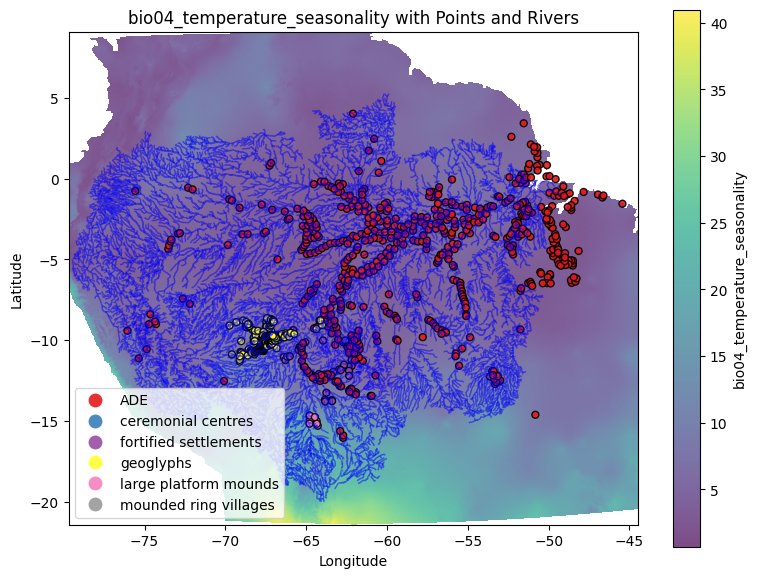

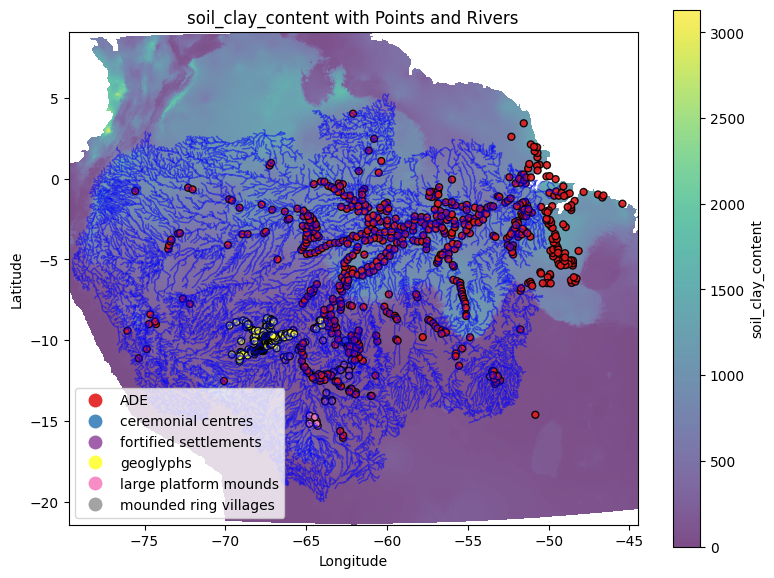

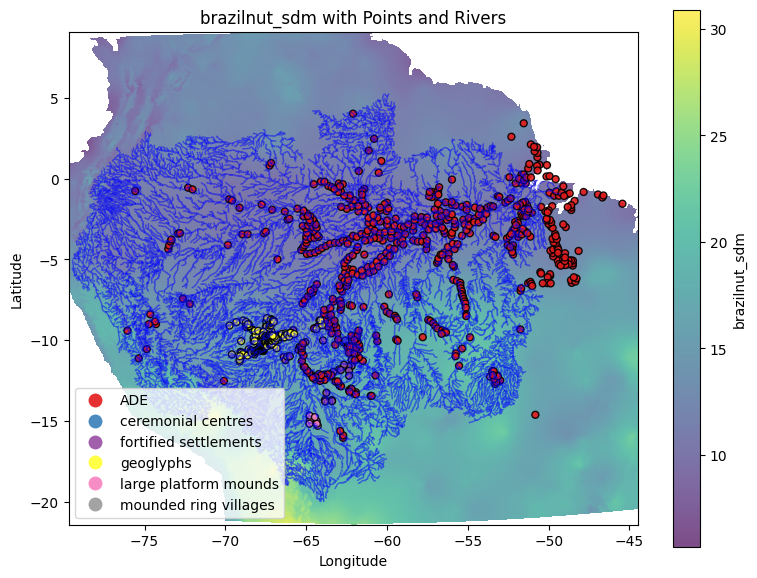

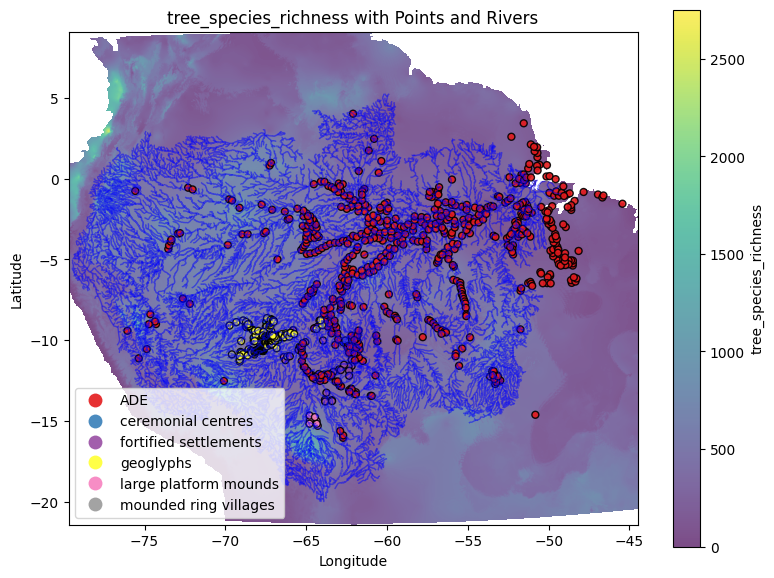

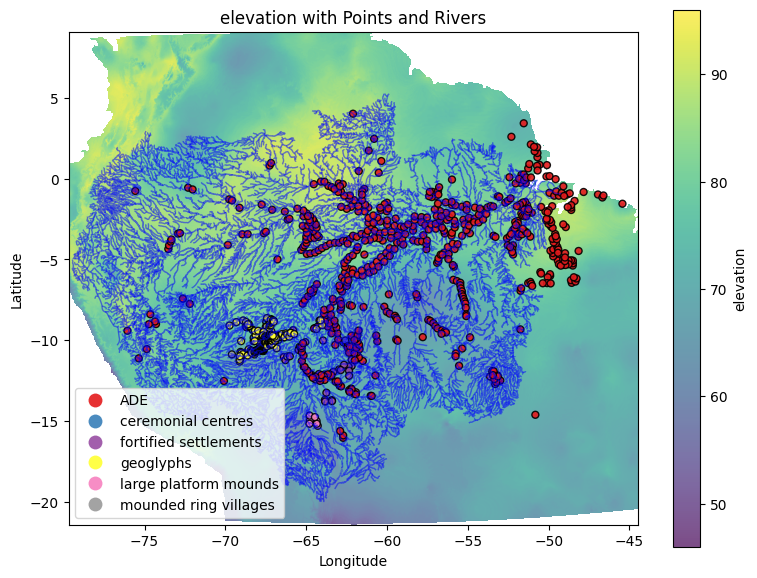

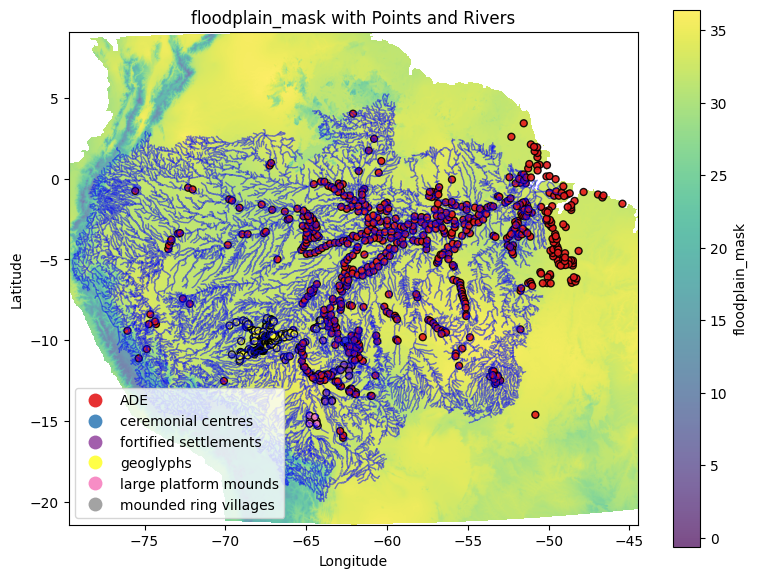

In [20]:
for i in range(1, min(src.count, len(band_names)) + 1):
    band = src.read(i)
    band_name = band_names[i - 1]
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Plot raster band with 70% opacity
    raster_plot = ax.imshow(
        band,
        cmap='viridis',
        norm=Normalize(vmin=np.nanmin(band), vmax=np.nanmax(band)),
        extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
        alpha=0.7  # 30% transparent
    )
    
    # Overlay rivers with 50% opacity
    rivers_gdf.plot(
        ax=ax,
        color='blue',
        linewidth=1,
        alpha=0.5,  # 50% transparent
        label='Rivers'
    )
    
    # Overlay points (on top)
    points_gdf.plot(
        ax=ax,
        column='type',
        cmap='Set1',
        markersize=25,
        legend=True,
        alpha=0.9,
        edgecolor='black'
    )
    
    ax.set_title(f"{band_name} with Points and Rivers")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_aspect('equal')
    plt.colorbar(raster_plot, ax=ax, label=band_name)
    plt.tight_layout()
    plt.show()


**Convert to base64**

In [22]:
import base64
from io import BytesIO

# Store base64 images
base64_images = []

for i in range(1, min(src.count, len(band_names)) + 1):
    band = src.read(i)
    band_name = band_names[i - 1]
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    raster_plot = ax.imshow(
        band,
        cmap='viridis',
        norm=Normalize(vmin=np.nanmin(band), vmax=np.nanmax(band)),
        extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
        alpha=0.7
    )
    
    rivers_gdf.plot(
        ax=ax,
        color='blue',
        linewidth=1,
        alpha=0.5,
        label='Rivers'
    )
    
    points_gdf.plot(
        ax=ax,
        column='type',
        cmap='Set1',
        markersize=25,
        legend=True,
        alpha=0.9,
        edgecolor='black'
    )
    
    ax.set_title(f"{band_name} with Points and Rivers")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_aspect('equal')
    plt.colorbar(raster_plot, ax=ax, label=band_name)
    plt.tight_layout()

    # Save to BytesIO
    buffer = BytesIO()
    plt.savefig(buffer, format="png", bbox_inches='tight')
    buffer.seek(0)

    # Convert to base64
    image_base64 = base64.b64encode(buffer.read()).decode("utf-8")
    base64_images.append((band_name, image_base64))
    
    plt.close()


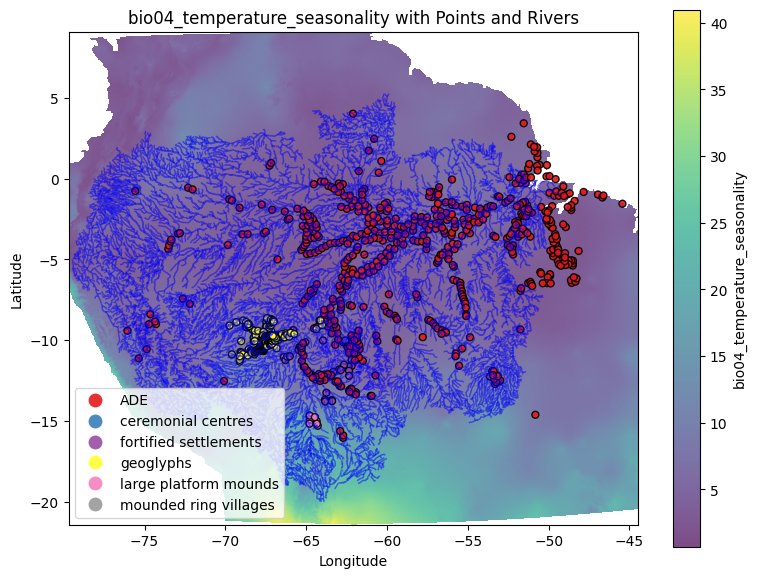

In [23]:
from IPython.display import Image, display
import IPython

# Show one image
display(IPython.display.Image(data=base64.b64decode(base64_images[0][1])))


# **Use Open AI's Vision-Enabled Model To Understand The Distribution of Archaeological Types Better** 

**gpt-4o (GPT-4 Omni) supports multimodal (text + image) input directly.**


In [24]:
pip install --upgrade openai


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 735.8/735.8 kB 12.3 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: openai
    Found existing installation: openai 1.70.0
    Uninstalling openai-1.70.0:
      Successfully uninstalled openai-1.70.0
Note: you may need to restart the kernel to use updated packages.


**List the base64 images to be used in the Open AI Vision model**

In [25]:
for i, (name, _) in enumerate(base64_images, 1):
    print(f"Image {i}: {name}")


Image 1: bio04_temperature_seasonality
Image 2: soil_clay_content
Image 3: brazilnut_sdm
Image 4: tree_species_richness
Image 5: elevation
Image 6: floodplain_mask


In [26]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load OpenAI API key from Kaggle Secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")

# Initialize the client
client = OpenAI(api_key=openai_key)

# === Build prompt ===
vision_prompt = [
    {
        "type": "text",
        "text": """
You are an expert in geospatial archaeology.

The following 6 environmental maps of the Amazon Basin display the distribution of archaeological artefacts, overlaid with:
- **Rivers** (in blue)
- **Artefact points** (colored by type)
- A unique **environmental variable** in the background raster

Maps:
1. bio04_temperature_seasonality
2. soil_clay_content
3. brazilnut_sdm
4. tree_species_richness
5. elevation
6. floodplain_mask

Instructions:
For each map, answer:
- Where are artefacts clustered?
- Do artefacts show spatial association with rivers?
- How might the environmental variable influence distribution?

Then compare across maps and highlight notable spatial patterns.
"""
    }
]

# Add the images (from base64_images)
for i, (name, b64_img) in enumerate(base64_images, 1):
    vision_prompt.append({
        "type": "text",
        "text": f"**Map {i}: {name}**"
    })
    vision_prompt.append({
        "type": "image_url",
        "image_url": {
            "url": f"data:image/png;base64,{b64_img}"
        }
    })

# === Make GPT-4o Vision request ===
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": vision_prompt
        }
    ],
    max_tokens=1800
)

# === Print GPT-4o response ===
print(response.choices[0].message.content)


### Map 1: bio04_temperature_seasonality
- **Artefact Clusters**: Artefacts are densely clustered in central and eastern regions.
- **Rivers Association**: Strong association with rivers, likely due to transportation and resource access.
- **Environmental Influence**: Areas with moderate temperature seasonality might be favorable for settlements due to stability in resources.

### Map 2: soil_clay_content
- **Artefact Clusters**: Similar clustering in central and eastern regions.
- **Rivers Association**: Artefacts often align with rivers.
- **Environmental Influence**: Areas with moderate clay content could support agriculture, influencing settlement locations.

### Map 3: brazilnut_sdm
- **Artefact Clusters**: Central and eastern regions again show significant clustering.
- **Rivers Association**: Present, highlighting the role of rivers in human distribution.
- **Environmental Influence**: Brazil nut tree suitability may indicate areas of prolonged human alteration and habitation.



In [27]:
# Extract the text response
gpt_response = response.choices[0].message.content


In [28]:
# Save to a text file
output_path = "gpt4_vision_interpretation.txt"
with open(output_path, "w", encoding="utf-8") as f:
    f.write(gpt_response)

print(f"Saved GPT response to: {output_path}")


Saved GPT response to: gpt4_vision_interpretation.txt


**Confirm with RAG**

In [56]:
vision_insight = """
Artefacts cluster in low-elevation, floodplain areas with high clay content and near river networks. 
Tree species richness and Brazilnut SDM appear to be strong predictors of site presence.
"""

# Use this as input to your RAG model
response3 = qa_chain.run(f"Do the archaeological literature findings support this pattern: {vision_insight}")
print(response3)


The text provided doesn't specifically mention that findings in archaeological literature support the pattern of artefacts clustering in low-elevation, floodplain areas with high clay content and near river networks. It also does not mention that tree species richness and Brazil nut SDM are strong predictors of site presence.


**Assessing the Evidence Base With RAGs**

In [57]:
gpt_vision_inferences = [
    "Artefacts are often located in floodplain regions.",
    "High clay content is associated with artefact locations.",
    "Artefacts cluster near Brazilnut-rich zones.",
    "Tree species richness is a strong predictor of artefact distribution.",
    "Artefacts are more common in high elevation areas."
]


In [58]:
rag_scores = []

for inference in gpt_vision_inferences:
    rag_response = qa_chain.run(f"Does Amazonian archaeological literature support: {inference}")
    
    # Simple scoring heuristic (can refine later)
    if any(keyword in rag_response.lower() for keyword in ["yes", "supported", "evidence", "confirms", "consistent"]):
        score = 1
    elif any(neg in rag_response.lower() for neg in ["no", "contradict", "not supported"]):
        score = 0
    else:
        score = 0.5  # Neutral or uncertain

    rag_scores.append({
        "inference": inference,
        "rag_response": rag_response,
        "score": score
    })


In [59]:
import pandas as pd

df_scores = pd.DataFrame(rag_scores)
display(df_scores[["inference", "score"]])  # Quick view


,inference,score
0,Artefacts are often located in floodplain regi...,1.0
1,High clay content is associated with artefact ...,0.0
2,Artefacts cluster near Brazilnut-rich zones.,0.0
3,Tree species richness is a strong predictor of...,0.5
4,Artefacts are more common in high elevation ar...,0.0


**Carry out Principal Component Analysis (PCA) on the full raster stack to get the uncorrelated bands which explain the maximum variation in the data**

Reduced to 11 components
Explained variance ratio: [0.4021284  0.10068251 0.09052736 0.0772956  0.06210737 0.05945056
 0.05187871 0.03803574 0.02834405 0.02320202 0.02222983]
Total explained variance: 0.96


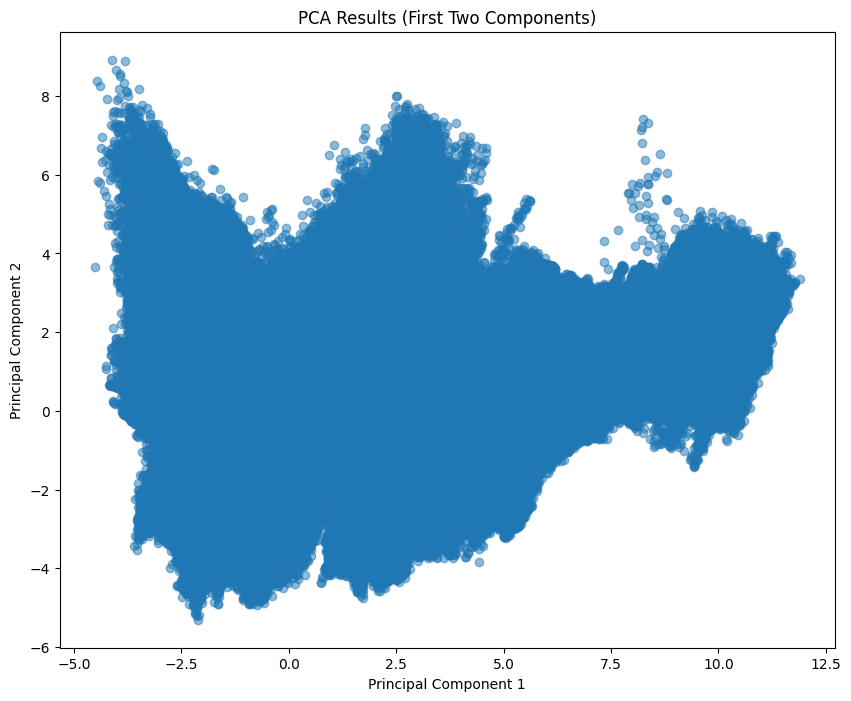

Final feature matrix shape: (6454874, 13)
Ready for spatial clustering (e.g., DBSCAN)


In [60]:
import rasterio
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

def load_and_preprocess_raster(file_path):
    """Load raster data and handle NaN values."""
    with rasterio.open(file_path) as src:
        data = src.read()  # Shape: (n_bands, height, width)
        n_bands, height, width = data.shape
        
        # Reshape to 2D (pixels x bands)
        data_2d = data.reshape(n_bands, -1).T  # Shape: (n_pixels, n_bands)
        
        # Create mask of valid pixels (non-NaN in all bands)
        valid_mask = ~np.isnan(data_2d).any(axis=1)
        data_clean = data_2d[valid_mask]
        
        # Get coordinates for valid pixels
        rows, cols = np.indices((height, width))
        coords = np.column_stack((cols.ravel(), rows.ravel()))[valid_mask]
        
        return data_clean, coords, (height, width), valid_mask

def perform_pca(data, variance_threshold=0.95):
    """Perform PCA with variance threshold."""
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)
    
    pca = PCA(n_components=variance_threshold)
    pca_result = pca.fit_transform(data_scaled)
    
    print(f"Reduced to {pca.n_components_} components")
    print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
    print(f"Total explained variance: {np.sum(pca.explained_variance_ratio_):.2f}")
    
    return pca_result, pca

# Main processing pipeline
raster_path = '/kaggle/working/final_environmental_stack.tif'

# 1. Load and preprocess data
data_clean, coords, original_shape, valid_mask = load_and_preprocess_raster(raster_path)

# 2. Perform PCA
pca_result, pca_model = perform_pca(data_clean)

# 3. Optional: Visualize first two components
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Results (First Two Components)')
plt.show()

# 4. Prepare data for spatial clustering (combine PCA results with coordinates)
# Scale coordinates to match PCA feature range
coord_scaler = StandardScaler()
coords_scaled = coord_scaler.fit_transform(coords)

# Combine features and coordinates
spatial_features = np.hstack([pca_result, coords_scaled])

print(f"Final feature matrix shape: {spatial_features.shape}")


In [61]:
# Examine PC loadings to interpret components
loadings = pca_model.components_  # Shape: (11, n_original_bands)

# For PC1 (most important component)
print("Top contributing bands to PC1:")
print(np.argsort(np.abs(loadings[0]))[-5:])  # Indices of top 5 bands

Top contributing bands to PC1:
[14  9  0  6  2]


Bands such as elevation and temperature seasonality constitute PC1

/tmp/ipykernel_35/1278014984.py:54: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_35/1278014984.py:54: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_35/1278014984.py:54: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


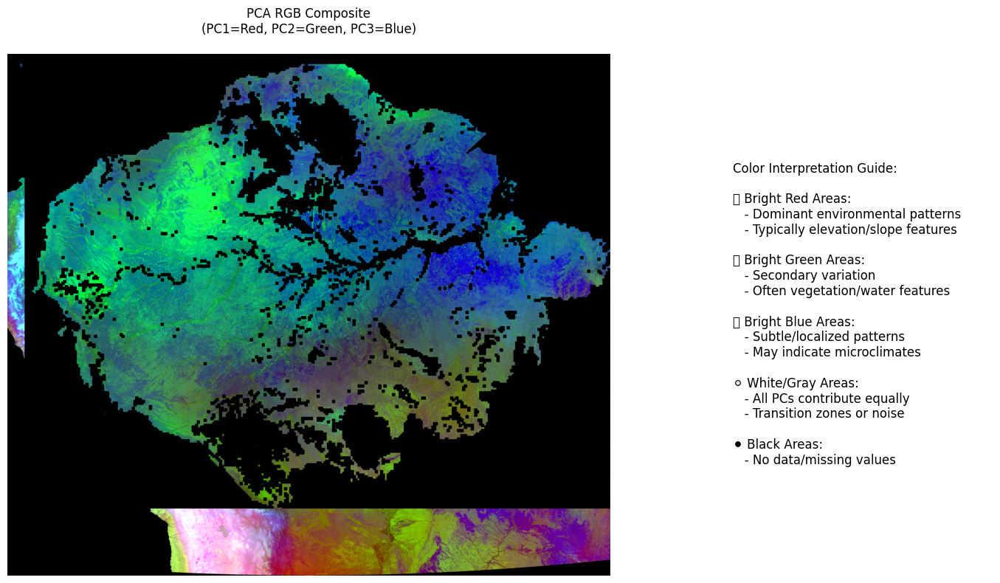

In [63]:
# Recreate the PCA RGB composite with proper scaling
def create_enhanced_pca_rgb(pca_result, original_shape, valid_mask):
    """Enhanced version with better contrast and interpretation"""
    # Initialize RGB array
    rgb = np.zeros((original_shape[0], original_shape[1], 3))
    
    # Normalize each principal component separately
    for i in range(3):
        if i < pca_result.shape[1]:
            band = pca_result[:, i]
            # Robust scaling to minimize outlier effects
            p2, p98 = np.percentile(band, [2, 98])
            rgb[valid_mask.reshape(original_shape), i] = np.clip((band - p2) / (p98 - p2), 0, 1)
    
    return rgb

# Generate enhanced visualization
pca_rgb = create_enhanced_pca_rgb(pca_result, original_shape, valid_mask)

# Create figure with interpretation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

# Main RGB plot
im = ax1.imshow(pca_rgb)
ax1.set_title('PCA RGB Composite\n(PC1=Red, PC2=Green, PC3=Blue)', pad=20)
ax1.axis('off')

# Interpretation guide
interpretation = """
Color Interpretation Guide:

🔴 Bright Red Areas:
   - Dominant environmental patterns
   - Typically elevation/slope features

🟢 Bright Green Areas:
   - Secondary variation
   - Often vegetation/water features

🔵 Bright Blue Areas:
   - Subtle/localized patterns
   - May indicate microclimates

⚪ White/Gray Areas:
   - All PCs contribute equally
   - Transition zones or noise

⚫ Black Areas:
   - No data/missing values
"""
ax2.text(0.1, 0.5, interpretation, ha='left', va='center', fontsize=12)
ax2.axis('off')

plt.tight_layout()
plt.show()

**Visualize and Encode PCA RGB with Points**

In [80]:
import base64
from io import BytesIO
import matplotlib.pyplot as plt

# Create plot with overlayed points
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

# Main RGB image
ax1.imshow(pca_rgb)
points_gdf.plot(ax=ax1, color='white', edgecolor='black', markersize=30, alpha=0.9, label="Known Archaeological Sites")
ax1.set_title("PCA RGB Composite + Known Sites", pad=20)
ax1.axis("off")

# Text legend panel
legend_text = """
🔴 PC1 (Red) = Elevation/Slope gradients  
🟢 PC2 (Green) = Vegetation/Hydrology  
🔵 PC3 (Blue) = Microclimates or subtle signals  

White dots = Known archaeological sites (from ground survey or literature)
"""
ax2.text(0.1, 0.5, legend_text, ha="left", va="center", fontsize=12)
ax2.axis("off")

# Save to buffer
buffer = BytesIO()
plt.tight_layout()
plt.savefig(buffer, format="png", bbox_inches="tight")
buffer.seek(0)

# Convert to base64
image_base64 = base64.b64encode(buffer.read()).decode("utf-8")
plt.close()


/tmp/ipykernel_35/2537589648.py:27: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_35/2537589648.py:27: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_35/2537589648.py:27: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_35/2537589648.py:28: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from current font.
  plt.savefig(buffer, format="png", bbox_inches="tight")
/tmp/ipykernel_35/2537589648.py:28: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from current font.
  plt.savefig(buffer, format="png", bbox_inches="tight")
/tmp/ipykernel_35/2537589648.py:28: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from current font.
  plt.savefig(buffer, format="png", bbox_inches="tight")


In [81]:
vision_prompt = """
You are a geospatial archaeology assistant.

The attached image is a PCA RGB composite of environmental variables from the Amazon basin. 
It shows environmental gradients from multiple raster bands including elevation, tree species richness, floodplain mask, and modeled species distributions.

- White dots show **known archaeological sites**
- Your task is to analyze the visual patterns and **suggest additional regions** in the map that:
  - Match or resemble known site locations
  - Show environmental transitions or anomalies
  - Appear promising for **new archaeological surveys**

Please describe:
- 2–3 regions (e.g., “central band”, “upper left quadrant”) with potential
- The visual reasoning (color patterns, edge zones, gradients)
- Any alignment with known site patterns
"""


In [82]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": vision_prompt},
            {
                "type": "image_url",
                "image_url": {
                    "url": f"data:image/png;base64,{image_base64}"
                }
            }
        ]
    }
]

response = client.chat.completions.create(
    model="gpt-4o",
    messages=messages,
    max_tokens=1000
)

# Extract and print
output_text = response.choices[0].message.content
print(output_text)




Analyzing the PCA RGB composite image, we can identify potential regions for new archaeological surveys based on environmental patterns and known site distributions:

### Region 1: Central Band
- **Location:** Runs horizontally across the central portion of the map.
- **Visual Patterns:** This area shows a transition from blue to green with a hint of red, indicating a gradient in microclimates and vegetation. The presence of multiple white dots suggests a correlation between known sites and these transitional zones.
- **Potential:** The transitions indicate environmental diversity, which might have supported varied ancient human activities or settlements.

### Region 2: Upper Right Quadrant
- **Location:** Near the top right of the map.
- **Visual Patterns:** Predominantly blue with areas of green and isolated red patches. This suggests distinct microclimates and possible subtle environmental anomalies.
- **Potential:** Few known sites already exist near this gradient zone, pointing to

**Let's use the previous Open Ai Vision Model to Explore the PC1 Contributory Bands**

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import base64
from io import BytesIO
import os

def generate_and_save_maps_for_bands(
    raster_path,
    band_indices_0based,
    band_names_dict,
    points_gdf,
    rivers_gdf,
    output_dir="pca_band_maps"
):
    """
    Generate visual maps for selected raster bands, overlay artefacts and rivers,
    save PNG locally, and return base64-encoded versions.
    
    Returns:
        List of (band_name, base64_image_str)
    """
    import rasterio

    os.makedirs(output_dir, exist_ok=True)
    base64_outputs = []

    with rasterio.open(raster_path) as src:
        # Reproject vectors to match raster
        points = points_gdf.to_crs(src.crs)
        rivers = rivers_gdf.to_crs(src.crs)

        for idx in band_indices_0based:
            band_number = idx + 1  # Convert to 1-based indexing
            band_name = band_names_dict.get(idx, f"Band {band_number}")
            band = src.read(band_number)

            fig, ax = plt.subplots(figsize=(8, 6))
            im = ax.imshow(
                band,
                cmap="viridis",
                norm=Normalize(vmin=band.min(), vmax=band.max()),
                extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                alpha=0.7
            )

            rivers.plot(ax=ax, color="blue", linewidth=1, alpha=0.5)
            points.plot(ax=ax, column='type', cmap='Set1', markersize=25, legend=True, alpha=0.9, edgecolor='black')

            ax.set_title(f"{band_name} with Artefact Points and Rivers")
            ax.set_xlabel("Longitude")
            ax.set_ylabel("Latitude")
            ax.set_aspect("equal")
            plt.colorbar(im, ax=ax, label=band_name)
            plt.tight_layout()

            # Save to PNG file
            filename = f"{idx+1:02d}_{band_name.replace(' ', '_')}.png"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format="png", bbox_inches="tight")

            # Also save as base64
            buffer = BytesIO()
            plt.savefig(buffer, format="png", bbox_inches="tight")
            buffer.seek(0)
            b64_image = base64.b64encode(buffer.read()).decode("utf-8")
            base64_outputs.append((band_name, b64_image))
            plt.close()

    return base64_outputs


In [ ]:
base64_pca_maps = generate_and_save_maps_for_bands(
    raster_path="/kaggle/working/final_environmental_stack.tif",
    band_indices_0based=[14, 9, 0, 6, 2],
    band_names_dict={
        0: "bio04_temperature_seasonality",
        2: "bio07_temperature_annual_range",
        6: "bio02_mean_diurnal_range",
        9: "soil_ph",
        14: "elevation"
    },
    points_gdf=points_gdf,
    rivers_gdf=rivers_gdf,
    output_dir="pca_band_maps"
)


In [90]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load key from Kaggle secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# Compose GPT-4 Vision prompt
vision_prompt = [
    {
        "type": "text",
        "text": """
You are a spatial archaeologist.

The following five maps show the distribution of archaeological artefacts in the Amazon Basin. Each map overlays:
- **Rivers** (in blue)
- **Artefact points** (colored by type)
- A raster background representing a key environmental layer

The bands were selected based on PCA importance for spatial variance.

For each map, interpret:
1. Where do artefacts cluster?
2. Do they align with certain environmental thresholds (e.g., elevation, soil pH)?
3. Are there spatial similarities or differences across bands?

Then synthesize the maps to identify regions or conditions where undiscovered archaeological artefacts might exist.
"""
    }
]

# Append all base64 images
for i, (band_name, b64_img) in enumerate(base64_pca_maps, 1):
    vision_prompt.append({
        "type": "text",
        "text": f"**Map {i}: {band_name}**"
    })
    vision_prompt.append({
        "type": "image_url",
        "image_url": {
            "url": f"data:image/png;base64,{b64_img}"
        }
    })

# Run GPT-4o Vision
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": vision_prompt
        }
    ],
    max_tokens=2000
)

# Print GPT-4 Vision response
print(response.choices[0].message.content)


### Map Interpretations

#### Map 1: Elevation
1. **Artefact Clusters:** Artefacts are clustered along river systems and in regions of moderate elevation.
2. **Environmental Alignment:** Artefacts appear to avoid very high elevation areas and are more concentrated in low to mid-elevation zones.
3. **Spatial Similarities/Differences:** Elevated artefacts' distribution suggests they thrive in accessible areas, possibly due to settlement convenience.

#### Map 2: Soil pH
1. **Artefact Clusters:** Clusters align predominantly with moderate pH levels.
2. **Environmental Alignment:** Artefacts tend to avoid areas with extreme soil pH, suggesting a preference for more neutral zones conducive to agriculture and habitation.
3. **Spatial Similarities/Differences:** The distribution matches the river outlines closely, indicating the importance of both water and soil quality.

#### Map 3: Temperature Seasonality
1. **Artefact Clusters:** Artefacts cluster where the temperature seasonality is moder

The **Sobel operator** belongs to a group of edge detecting operators based
on approximation of the first derivative of the image function. The operator
combines a noise suppressing smoothing operation with an estimation of the
first derivative for each pixel of the input image. It has been used for detecting archaeological sites



In [91]:
from scipy.ndimage import sobel
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import base64
from io import BytesIO
import rasterio

def generate_sobel_maps_for_bands(
    raster_path,
    band_indices_0based,
    band_names_dict,
    points_gdf,
    rivers_gdf,
    output_dir="sobel_band_maps"
):
    os.makedirs(output_dir, exist_ok=True)
    sobel_maps = []

    with rasterio.open(raster_path) as src:
        points = points_gdf.to_crs(src.crs)
        rivers = rivers_gdf.to_crs(src.crs)

        for idx in band_indices_0based:
            band_number = idx + 1
            band_name = band_names_dict.get(idx, f"Band {band_number}")
            band = src.read(band_number).astype(float)

            # Apply Sobel in X and Y directions
            sobel_x = sobel(band, axis=1, mode='reflect')
            sobel_y = sobel(band, axis=0, mode='reflect')
            gradient = np.hypot(sobel_x, sobel_y)

            # Plot
            fig, ax = plt.subplots(figsize=(8, 6))
            im = ax.imshow(
                gradient,
                cmap='magma',
                extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                norm=Normalize(vmin=np.percentile(gradient, 2), vmax=np.percentile(gradient, 98)),
                alpha=0.8
            )

            rivers.plot(ax=ax, color='blue', linewidth=1, alpha=0.5)
            points.plot(ax=ax, column='type', cmap='Set1', markersize=25, legend=True, alpha=0.9, edgecolor='black')

            ax.set_title(f"Sobel Gradient: {band_name}")
            ax.set_xlabel("Longitude")
            ax.set_ylabel("Latitude")
            ax.set_aspect("equal")
            plt.colorbar(im, ax=ax, label="Edge Magnitude")
            plt.tight_layout()

            # Save to PNG
            filename = f"{idx+1:02d}_{band_name.replace(' ', '_')}_sobel.png"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format="png", bbox_inches="tight")

            # Save as base64
            buffer = BytesIO()
            plt.savefig(buffer, format="png", bbox_inches="tight")
            buffer.seek(0)
            b64_img = base64.b64encode(buffer.read()).decode("utf-8")
            sobel_maps.append((f"{band_name} (Sobel)", b64_img))
            plt.close()

    return sobel_maps


In [92]:
sobel_maps = generate_sobel_maps_for_bands(
    raster_path="/kaggle/working/final_environmental_stack.tif",
    band_indices_0based=[14, 9, 0, 6, 2],  # Top PCA bands
    band_names_dict={
        0: "bio04_temperature_seasonality",
        2: "bio07_temperature_annual_range",
        6: "bio02_mean_diurnal_range",
        9: "soil_ph",
        14: "elevation"
    },
    points_gdf=points_gdf,
    rivers_gdf=rivers_gdf,
    output_dir="sobel_band_maps"
)


In [93]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load OpenAI key from Kaggle secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# === Construct Prompt ===
sobel_prompt = [
    {
        "type": "text",
        "text": """
You are a spatial data archaeologist.

The following five maps show Sobel-enhanced edge detections of environmental variables in the Amazon Basin. Each map overlays:
- **Archaeological artefact points** (colored by type)
- **River networks** (in blue)
- A **Sobel gradient background** showing spatial transitions in the environmental layer

Instructions:
1. For each map, identify zones of strong gradients (e.g., environmental boundaries or ridgelines).
2. Evaluate whether artefact locations tend to fall on or near these gradient zones.
3. Compare across maps — which environmental transitions appear most archaeologically relevant?
4. Suggest how edge-based environmental features might inform site discovery or predictive modeling.
"""
    }
]

# Append all 5 Sobel-enhanced base64 maps
for i, (band_name, b64_img) in enumerate(sobel_maps, 1):
    sobel_prompt.append({
        "type": "text",
        "text": f"**Sobel Map {i}: {band_name}**"
    })
    sobel_prompt.append({
        "type": "image_url",
        "image_url": {
            "url": f"data:image/png;base64,{b64_img}"
        }
    })

# === Run GPT-4o Vision
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": sobel_prompt
        }
    ],
    max_tokens=2000
)

# === Output Response
print(response.choices[0].message.content)


1. **Identify Zones of Strong Gradients:**
   
   - **Elevation:** Strong gradients appear along the western and northern edges, indicating mountainous or elevated areas.
   - **Soil pH:** High gradient zones are scattered, with some alignment along river networks.
   - **Temperature Seasonality (bio04):** Gradients are less pronounced but are present throughout, with varied distribution.
   - **Mean Diurnal Range (bio02):** Clear contour-like gradients throughout, indicating variability in daily temperature ranges.
   - **Temperature Annual Range (bio07):** Gradients are less distinct, distributed across the area.

2. **Artefact Location Evaluation:**
   
   - **Elevation**: Artefact locations, particularly ADE and ceremonial centers, align with gradient zones indicating areas of interest likely influenced by topography.
   - **Soil pH**: Artefacts scattered along lower gradients suggest some correlation with soil pH gradients, possibly related to agricultural potential.
   - **Temper

In [94]:
# Extract GPT-4 Vision output
sobel_analysis = response.choices[0].message.content

# Save to file
output_path = "sobel_gpt4_vision_analysis.txt"
with open(output_path, "w", encoding="utf-8") as f:
    f.write(sobel_analysis)

print(f"Saved GPT-4 Vision response to: {output_path}")


Saved GPT-4 Vision response to: sobel_gpt4_vision_analysis.txt


# **Lets look at Acre**

 

**Acre, a Brazillian state is the home to many archeological sites, including geoglyphs**

Official boundaries of acre- https://earthworks.stanford.edu/catalog/stanford-ht537bw2719

In [2]:
# Before running this code, install or check for these libraries
# !pip install geopandas folium

import requests
import geopandas as gpd
import folium

# Accept user input for the GeoServer URL and the typeName of the layer
geoserver_url = "https://geowebservices.stanford.edu/geoserver/wfs?"
type_name = "druid:ht537bw2719"

# Define the parameters for the WFS service
params = {
    'service': 'WFS',
    'version': '2.0.0',
    'request': 'GetFeature',
    'typeName': type_name,
    'outputFormat': 'application/json'
}

# Send a GET request to the GeoServer WFS service
response = requests.get(geoserver_url, params=params)

# Load the features from the WFS service into a GeoDataFrame
acre = gpd.read_file(response.text)

# Get the bounds of the GeoDataFrame
bounds = acre.total_bounds

# Calculate the center of the bounds
center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]

# Create the map
m = folium.Map(location=center, zoom_start=2)

# Add the GeoDataFrame to the map as a GeoJson layer
folium.GeoJson(acre).add_to(m)

# Display the map
m

**Check the variable type of Acre**

In [4]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 63.8 MB/s eta 0:00:00:00:0100:01


In [5]:
import rasterio
from rasterio.mask import mask  # Explicit import
import numpy as np

# 1. Reset the environment (in case 'mask' was overwritten)
if 'mask' in globals():
    del mask
from rasterio.mask import mask  # Re-import

# 2. Verify geometry type
print(f"Acre geometry type: {type(acre.geometry)}")  # Should be GeoSeries

Acre geometry type: <class 'geopandas.geoseries.GeoSeries'>


**Lets clip the rasters o the extent of Acre**

In [15]:
with rasterio.open(raster_path) as src:
    # Get pixel coordinates of Acre bounds
    minx, miny, maxx, maxy = acre.total_bounds
    window = src.window(minx, miny, maxx, maxy)
    subset = src.read(window=window)

# Now visualize subset (same plotting code as above)

In [16]:
import rasterio
from rasterio.windows import Window

# Open your original raster
raster_path = '/kaggle/working/final_environmental_stack.tif'

with rasterio.open(raster_path) as src:
    # Create window for your subset
    minx, miny, maxx, maxy = acre.total_bounds  # Your bounding box
    window = src.window(minx, miny, maxx, maxy)
    
    # Read the subset
    subset = src.read(window=window)
    
    # Print band names (descriptions)
    print("Band Names:")
    for i in range(1, src.count + 1):
        print(f"Band {i}: {src.descriptions[i-1] if src.descriptions else 'No description'}")
    
    # Print additional band info
    print("\nBand Details:")
    for i in range(1, src.count + 1):
        print(f"Band {i}:")
        print(f"  Data type: {src.dtypes[i-1]}")
        print(f"  NoData value: {src.nodatavals[i-1]}")
        print(f"  Statistics: {src.statistics(i)}")

Band Names:
Band 1: bio04_temperature_seasonality
Band 2: bio19_precipitation_coldest_quarter
Band 3: bio07_temperature_annual_range
Band 4: bio18_precipitation_warmest_quarter
Band 5: bio03_isothermality
Band 6: bio05_max_temp_warmest_month
Band 7: bio02_mean_diurnal_range
Band 8: bio15_precipitation_seasonality
Band 9: soil_clay_content
Band 10: soil_ph
Band 11: soil_organic_carbon
Band 12: soil_texture
Band 13: brazilnut_sdm
Band 14: tree_species_richness
Band 15: elevation
Band 16: slope_degrees
Band 17: floodplain_mask

Band Details:
Band 1:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=0.7200000286102295, max=40.970001220703125, mean=8.42419798249208, std=6.398249980863826)
Band 2:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=0.0, max=3132.0, mean=450.74009937432766, std=404.2180494626425)
Band 3:
  Data type: float32
  NoData value: -9999.0


/tmp/ipykernel_35/4239492403.py:26: RasterioDeprecationWarning: statistics() will be removed in 2.0.0. Please switch to stats().
  print(f"  Statistics: {src.statistics(i)}")


  Statistics: Statistics(min=5.699999809265137, max=30.899999618530273, mean=14.859318604090369, std=3.8134786615192913)
Band 4:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=0.0, max=2751.0, mean=400.6008549463591, std=213.33761723393033)
Band 5:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=46.0, max=96.0, mean=76.16015564386178, std=7.610150161733898)
Band 6:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=-0.6000000238418579, max=36.400001525878906, mean=31.28034709754491, std=4.370785110688327)
Band 7:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=4.5, max=21.100000381469727, mean=11.1652861091831, std=2.0827092007432766)
Band 8:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=0.0, max=214.0, mean=58.70135444173538, std=23.699854648297027)
Band 9:
  Data type: float32
  NoData value: -9999.0
  Statistics: Statistics(min=0.0, max=63.920711517333984

**Let's clean the raster to remove infinite and negative values**

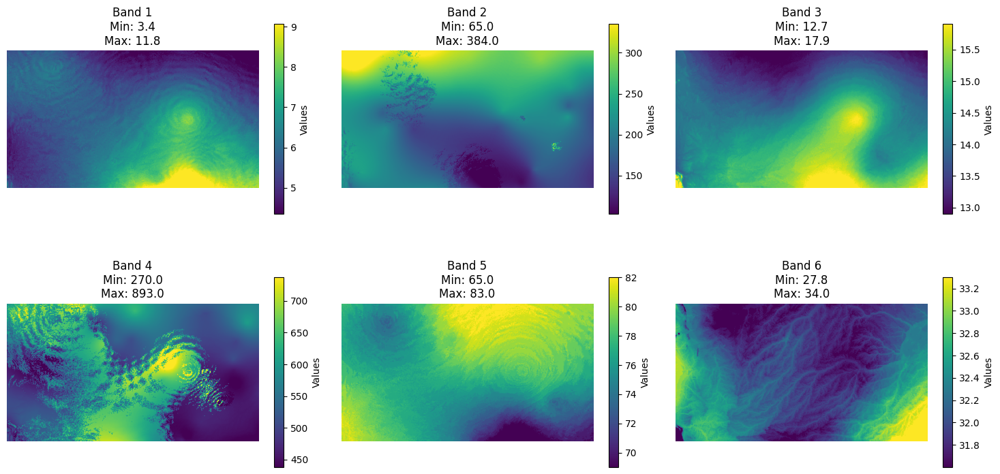

Displaying bands 1-6 of 17 total bands
Window dimensions: 449 rows x 821 columns


In [17]:
import matplotlib.pyplot as plt
import numpy as np

# Visualize the first 6 bands with proper scaling
bands_to_show = min(6, subset.shape[0])  # Show up to 6 bands

plt.figure(figsize=(15, 8))
for i in range(bands_to_show):
    plt.subplot(2, 3, i+1)
    
    # Get current band and handle NaN/inf values
    band = subset[i].astype(float)
    band[~np.isfinite(band)] = np.nan  # Replace inf/-inf with NaN
    
    # Calculate percentiles for robust scaling
    p2, p98 = np.nanpercentile(band, [2, 98])
    
    # Display with optimized contrast
    plt.imshow(band, cmap='viridis', vmin=p2, vmax=p98)
    plt.colorbar(label='Values', shrink=0.7)
    
    # Add band statistics (using only valid values)
    valid_vals = band[~np.isnan(band)]
    plt.title(f'Band {i+1}\nMin: {np.min(valid_vals):.1f}\nMax: {np.max(valid_vals):.1f}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Print basic info
print(f"Displaying bands 1-{bands_to_show} of {subset.shape[0]} total bands")
print(f"Window dimensions: {subset.shape[1]} rows x {subset.shape[2]} columns")

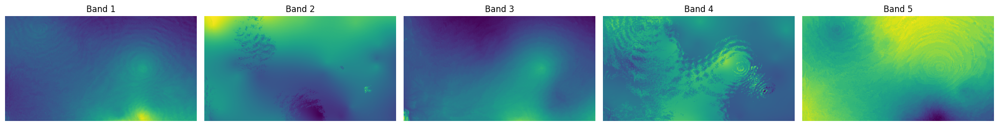

In [18]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

# Path to raster
raster_path = "/kaggle/working/final_environmental_stack.tif"

# Open and extract raster within acre bounding box
with rasterio.open(raster_path) as src:
    minx, miny, maxx, maxy = acre.total_bounds
    window = src.window(minx, miny, maxx, maxy)
    transform = src.window_transform(window)
    subset = src.read(window=window)
    nodata = src.nodata

# Replace nodata (-9999) with np.nan
subset = np.where(subset == nodata, np.nan, subset)

# Interpolate each band using nearest-neighbor fill
def fill_nan_band(band):
    mask = np.isnan(band)
    filled = band.copy()
    filled[mask] = ndimage.generic_filter(
        band, 
        function=lambda values: np.nanmean(values), 
        size=3,
        mode='nearest'
    )[mask]
    return filled

filled_subset = np.array([fill_nan_band(band) for band in subset])

# Visualize the first few bands
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i in range(5):
    ax = axes[i]
    ax.imshow(filled_subset[i], cmap='viridis')
    ax.set_title(f"Band {i+1}")
    ax.axis('off')
plt.tight_layout()
plt.show()


**Check if the geographic coordinates are there**

In [19]:
import numpy as np
import rasterio

# Assume transform is the affine from your clipped raster
bands, height, width = filled_subset.shape

# Generate grid of row and column indices
rows, cols = np.meshgrid(np.arange(height), np.arange(width), indexing="ij")

# Compute flattened coordinates
xs, ys = rasterio.transform.xy(transform, rows.flatten(), cols.flatten(), offset='center')

# Reshape back to 2D arrays matching raster dimensions
xs = np.array(xs).reshape((height, width))
ys = np.array(ys).reshape((height, width))

# Confirm sample point
print("Sample (x, y) at (0, 0):", xs[0, 0], ys[0, 0])


Sample (x, y) at (0, 0): -73.98843903357941 -7.116128126420597


In [20]:
import numpy as np
import pandas as pd
from rasterio.transform import xy

# Shape: (bands, height, width)
bands, height, width = filled_subset.shape

# Reshape to (height * width, bands)
data = filled_subset.transpose(1, 2, 0).reshape(-1, bands)

# Compute pixel coordinates
rows, cols = np.meshgrid(np.arange(height), np.arange(width), indexing="ij")
xs, ys = rasterio.transform.xy(transform, rows, cols)
x_coords = np.array(xs).flatten()
y_coords = np.array(ys).flatten()

# Build DataFrame
df_pixels = pd.DataFrame(data, columns=[
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "bio02_mean_diurnal_range",
    "bio15_precipitation_seasonality",
    "soil_clay_content",
    "soil_ph",
    "soil_organic_carbon",
    "soil_texture",
    "brazilnut_sdm",
    "tree_species_richness",
    "elevation",
    "slope_degrees",
    "floodplain_mask"
])
df_pixels["x"] = x_coords
df_pixels["y"] = y_coords


In [21]:
# Drop NaNs before computing stats
stats = df_pixels.describe()
print(stats)


       bio04_temperature_seasonality  bio19_precipitation_coldest_quarter  \
count                  368629.000000                        368629.000000   
mean                        6.156247                           209.507462   
std                         1.155143                            57.850323   
min                         3.380000                            65.000000   
25%                         5.390000                           166.000000   
50%                         5.910000                           206.000000   
75%                         6.850000                           250.000000   
max                        11.820000                           384.000000   

       bio07_temperature_annual_range  bio18_precipitation_warmest_quarter  \
count                   368629.000000                        368629.000000   
mean                        14.345008                           554.664917   
std                          0.777915                            85.9781

**The corrected Acre-scale raster where coordinates are present**

In [ ]:
import matplotlib.pyplot as plt

# Pick a band to visualize
band_name = "bio04_temperature_seasonality"

plt.figure(figsize=(8, 6))
plt.scatter(df_pixels["x"], df_pixels["y"], c=df_pixels[band_name],
            cmap="viridis", s=1, alpha=0.7)
plt.colorbar(label=band_name)
plt.title(f"Spatial Distribution of {band_name}")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.gca().set_aspect("equal")
plt.show()


**Implement PCA on the Acre boundary**

In [ ]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Check the shape first
data = df_pixels.to_numpy()
print("Data shape:", data.shape)  # Expecting (height * width, bands)

# If shape is (n_pixels, n_bands), proceed directly
valid_mask = ~np.isnan(data).any(axis=1)
X_clean = data[valid_mask]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_clean)

# PCA
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Optionally print variance explained
print("Explained variance ratio:", pca.explained_variance_ratio_)


In [ ]:
# Reduce to 95% variance
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

print(f"Reduced to {pca.n_components_} components")
print("Explained variance ratio:", pca.explained_variance_ratio_)

**Look at the archaeological types**

In [ ]:
import pandas as pd

# Read the CSV file
csv_path = '/kaggle/input/different-archaeological-types/filtered_points.csv'
arch_points = pd.read_csv(csv_path)

# Show the first few rows of the data
arch_points.head()


In [ ]:
 # Replace missing values (NaNs) in 'type' column with a default type or category (optional)
arch_points['type'] = arch_points['type'].fillna('Unknown')


In [ ]:
unique_types = arch_points['type'].dropna().unique()
print("Unique 'type' values in arch_points:")
for t in unique_types:
    print("-", t)


In [ ]:
from shapely.geometry import Point
import geopandas as gpd

# Convert to GeoDataFrame
geometry = [Point(xy) for xy in zip(arch_points['POINT_X'], arch_points['POINT_Y'])]
arch_points = gpd.GeoDataFrame(arch_points, geometry=geometry, crs="EPSG:4326")  # WGS84

# Verify
print(arch_points.head())
print(f"CRS: {arch_points.crs}")


In [ ]:
# Required imports
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from shapely.geometry import Point
import geopandas as gpd

# Assume df_pixels: shape (n_pixels, n_bands), with coordinates in coord_cols
# Assume arch_points is a GeoDataFrame with 'geometry' column in EPSG:4326
# and 'type' column representing archaeological class labels

# Step 1: Ensure same CRS and convert arch_points to projected CRS if needed
arch_points = arch_points.to_crs("EPSG:4326")  # WGS84

# Step 2: Create spatial index from df_pixels
# Assume pixel_coords: (n_pixels, 2) array of (lon, lat)
pixel_coords = df_pixels[["x", "y"]].values

# Step 3: Extract raster values at each archaeological point
from scipy.spatial import cKDTree

# KD-Tree for fast nearest-neighbor lookup
pixel_tree = cKDTree(pixel_coords)

# Get point coordinates
site_coords = np.array([(geom.x, geom.y) for geom in arch_points.geometry])

# Find nearest pixel index for each point (max distance ~1 pixel size)
distances, indices = pixel_tree.query(site_coords, distance_upper_bound=0.002)

# Filter valid matches
valid_mask = (distances != np.inf)
valid_points = arch_points[valid_mask].copy()
matched_indices = indices[valid_mask]

# Get features from df_pixels
X_train = df_pixels.iloc[matched_indices].drop(columns=["x", "y"]).values
y_train = valid_points["type"].values

# Step 4: Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y_train)

print("✅ Training set prepared:")
print(f"Samples: {X_train.shape[0]}, Features: {X_train.shape[1]}")
print("Classes:", le.classes_)


In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier

# Assuming:
# X_train is numpy array (n_samples, n_features)
# df_pixels is DataFrame with feature columns + ['x','y']
# rf is trained RandomForestClassifier

# 1. Get feature names from df_pixels (excluding coordinates)
feature_cols = [col for col in df_pixels.columns if col not in ['x', 'y']]

# 2. Prepare prediction data (ensure same order as training)
X_raster = df_pixels[feature_cols].values  # Convert to numpy array

# 3. Create valid pixel mask
valid_mask = ~np.isnan(X_raster).any(axis=1)
X_raster_clean = X_raster[valid_mask]

# 4. Predict
y_pred_flat = rf.predict(X_raster_clean)

# 5. Get grid dimensions from coordinates
x_coords = df_pixels['x'].unique()
y_coords = df_pixels['y'].unique()
width = len(x_coords)
height = len(y_coords)

# 6. Create output array
pred_raster = np.full(len(df_pixels), np.nan)
pred_raster[valid_mask] = y_pred_flat

# 7. Reshape to 2D (sort by y descending, x ascending)
df_sorted = df_pixels.sort_values(['y', 'x'], ascending=[False, True])
pred_raster_2d = pred_raster[df_pixels.index.get_indexer(df_sorted.index)].reshape(height, width)

# 8. Visualize
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
plt.imshow(pred_raster_2d, cmap='tab10')
plt.colorbar()
plt.title("Archaeological Type Predictions")
plt.axis('off')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# Assuming:
# pred_raster_2d - your 2D prediction array
# le - your LabelEncoder object (from y_train_encoded = le.fit_transform(y_train))

# 1. Create discrete colormap
n_classes = len(le.classes_)
colors = plt.cm.tab10(np.linspace(0, 1, n_classes))  # Or use another colormap
cmap = ListedColormap(colors[:n_classes])

# 2. Plot with discrete colors
plt.figure(figsize=(12, 8))
im = plt.imshow(pred_raster_2d, 
                cmap=cmap,
                vmin=-0.5,
                vmax=n_classes-0.5)

# 3. Create proper colorbar
cbar = plt.colorbar(im, ticks=np.arange(n_classes))
cbar.ax.set_yticklabels(le.classes_)  # Set actual class names

plt.title("Archaeological Type Predictions")
plt.axis('off')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Get predicted probabilities (n_samples × n_classes)
probs = rf.predict_proba(X_raster_clean)  # Ensure X_raster_clean matches training features

# Create a single figure with subplots for each class
fig, axes = plt.subplots(1, len(le.classes_), figsize=(20, 5))

# Normalize all plots to same scale
norm = Normalize(vmin=0, vmax=1)

for i, (class_name, ax) in enumerate(zip(le.classes_, axes)):
    # Reshape probabilities for this class
    prob_map = np.full(len(df_pixels), np.nan)
    prob_map[valid_mask] = probs[:, i]
    prob_map_2d = prob_map.reshape(height, width)
    
    # Plot with consistent colorscale
    im = ax.imshow(prob_map_2d, cmap='RdYlGn', norm=norm)
    ax.set_title(f'{class_name} Probability')
    ax.axis('off')

# Add single colorbar for all subplots
cbar = fig.colorbar(im, ax=axes, fraction=0.02, pad=0.04)
cbar.set_label('Prediction Probability', rotation=270, labelpad=20)

plt.tight_layout()
plt.show()

In [ ]:
for i, class_name in enumerate(le.classes_):
    plt.figure(figsize=(10, 8))
    
    # Create mask for valid pixels
    prob_map = np.full((height, width), np.nan)
    prob_map[valid_mask.reshape(height, width)] = probs[:, i]
    
    # Plot with hillshade effect
    plt.imshow(prob_map, cmap='RdYlGn', vmin=0, vmax=1)
    plt.colorbar(label='Probability', shrink=0.7)
    plt.title(f'Probability: {class_name}', pad=20)
    
    # Add grid lines (optional)
    plt.grid(True, color='black', linestyle=':', alpha=0.1)
    plt.axis('off')
    plt.show()

**Let's examine the ceremonial centre**

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Create figure
fig, ax = plt.subplots(figsize=(12, 10))

# Get index for ceremonial centres
class_idx = list(le.classes_).index('ceremonial centres')

# Prepare probability array
prob_map = np.full((height, width), np.nan)
prob_map[valid_mask.reshape(height, width)] = probs[:, class_idx]

# Plot probability heatmap
im = ax.imshow(prob_map, 
              cmap='RdYlGn', 
              norm=Normalize(0, 1),
              alpha=0.9)

# Overlay Acre boundary (as GeoSeries)
acre.boundary.plot(ax=ax, 
                  color='black',
                  linewidth=2,
                  linestyle='-')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Probability', rotation=270, labelpad=20)

# Formatting
ax.set_title('Ceremonial Centres Probability', fontsize=14, pad=20)
ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create figure with PlateCarree projection
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Get ceremonial centres probabilities
class_idx = list(le.classes_).index('ceremonial centres')
prob_map = np.full((height, width), np.nan)
prob_map[valid_mask.reshape(height, width)] = probs[:, class_idx]

# Plot probability heatmap
im = ax.imshow(prob_map,
              cmap='RdYlGn',
              norm=Normalize(0, 1),
              alpha=0.9,
              extent=[df_pixels['x'].min(), df_pixels['x'].max(),  # xmin, xmax
                     df_pixels['y'].min(), df_pixels['y'].max()], # ymin, ymax
              transform=ccrs.PlateCarree())

# Overlay Acre boundary (make sure it's in same CRS)
ax.add_geometries(acre.geometry,
                 crs=ccrs.PlateCarree(),
                 facecolor='none',
                 edgecolor='black',
                 linewidth=2)

# Add gridlines with labels
gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# Add colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('Probability', rotation=270, labelpad=20)



# Title and formatting
ax.set_title('Ceremonial Centres Probability with Acre Boundary', pad=20)
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd

# Load Amazon river network
river_files = {
    'shp': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.shp',
    'prj': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.prj',
    'dbf': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.dbf',
    'shx': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.shx'
}
rivers = gpd.read_file(river_files['shp']).to_crs(epsg=4326)  # Ensure WGS84

# Create figure
fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Plot probability heatmap
class_idx = list(le.classes_).index('ceremonial centres')
prob_map = np.full((height, width), np.nan)
prob_map[valid_mask.reshape(height, width)] = probs[:, class_idx]

im = ax.imshow(prob_map,
              cmap='RdYlGn',
              norm=Normalize(0, 1),
              alpha=0.85,  # Probability layer transparency
              extent=[df_pixels['x'].min(), df_pixels['x'].max(),
                     df_pixels['y'].min(), df_pixels['y'].max()],
              transform=ccrs.PlateCarree())

# Add Amazon rivers with adjustable transparency (0-1)
rivers.plot(ax=ax,
           color='blue',
           linewidth=0.8,
           alpha=0.4,  # River transparency (adjust this value)
           label='Amazon Rivers')

# Add Acre boundary
acre.boundary.plot(ax=ax,
                  edgecolor='black',
                  linewidth=2,
                  alpha=0.9)

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle=':', alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# Add colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.7, pad=0.05)
cbar.set_label('Ceremonial Centre Probability', rotation=270, labelpad=25)

# Add legend and title
ax.legend(loc='upper right')
ax.set_title('Ceremonial Centres Probability with Amazon River Network', pad=20, fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker

fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Set extent to match your data bounds
ax.set_extent([
    df_pixels['x'].min(), df_pixels['x'].max(),
    df_pixels['y'].min(), df_pixels['y'].max()
], crs=ccrs.PlateCarree())

# Add probability map (your existing code)
im = ax.imshow(prob_map, cmap='RdYlGn', norm=Normalize(0, 1), alpha=0.85,
              extent=[df_pixels['x'].min(), df_pixels['x'].max(),
                     df_pixels['y'].min(), df_pixels['y'].max()],
              transform=ccrs.PlateCarree())

# Configure gridlines with proper formatting
gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
gl.xlocator = cticker.LongitudeLocator()
gl.ylocator = cticker.LatitudeLocator()
gl.xformatter = cticker.LongitudeFormatter(zero_direction_label=True)
gl.yformatter = cticker.LatitudeFormatter()

# Control label placement
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = True
gl.left_labels = True

# Adjust label frequency if needed
gl.xlocator = cticker.LongitudeLocator(nbins=6)
gl.ylocator = cticker.LatitudeLocator(nbins=6)

# Add other elements (rivers, Acre boundary, etc.)
rivers.plot(ax=ax, color='blue', linewidth=0.8, alpha=0.4)
acre.boundary.plot(ax=ax, edgecolor='black', linewidth=2, alpha=0.9)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.7, pad=0.05)
cbar.set_label('Ceremonial Centre Probability', rotation=270, labelpad=25)

plt.title('Ceremonial Centres Probability with Amazon River Network', pad=20)
plt.tight_layout()
plt.show()

**Let's do sense check with the RAG Model I created before**

In [ ]:
import io

In [ ]:
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.output_parsers import StrOutputParser
from PIL import Image
import base64

# 1. Image Processing Function
def prepare_image_for_rag(fig):
    """Convert matplotlib figure to base64 text description"""
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi=150)
    img_str = base64.b64encode(buf.getvalue()).decode('utf-8')
    
    # Basic image description
    width, height = fig.get_size_inches()*fig.dpi
    return f"""
    ARCHAEOLOGICAL PROBABILITY MAP METADATA:
    - Dimensions: {width:.0f}x{height:.0f} pixels
    - Color scale: Red (high prob) to Green (low prob)
    - Coordinate range: 
      Lon: {df_pixels['x'].min():.2f}°W to {df_pixels['x'].max():.2f}°W
      Lat: {df_pixels['y'].min():.2f}°S to {df_pixels['y'].max():.2f}°S
    - Base64 Image: {img_str[:100]}...[truncated]
    """

# 2. Enhanced Prompt Template
archaeo_qa_prompt = ChatPromptTemplate.from_template("""
You are an archaeological analyst with access to research papers and site data.

CONTEXT FROM LITERATURE:
{context}

IMAGE ANALYSIS:
{image_metadata}

QUESTION:
{question}

INSTRUCTIONS:
1. Cross-reference patterns with known settlement principles
2. Identify 3 most relevant papers from metadata
3. Highlight any contradictions with established theories
4. Rate confidence in findings (1-5)
""")

# 3. Analysis Chain
def analyze_with_rag(fig, question):
    # Prepare inputs
    image_desc = prepare_image_for_rag(fig)
    relevant_docs = retriever.get_relevant_documents(question)
    
    # Format context
    context = "\n\n".join(
        f"Source: {doc.metadata['source']}\nContent: {doc.page_content}" 
        for doc in relevant_docs
    )
    
    # Generate analysis
    chain = archaeo_qa_prompt | llm | StrOutputParser()
    return chain.invoke({
        "context": context,
        "image_metadata": image_desc,
        "question": question
    })

# Usage Example
fig = plt.gcf()  # Get current probability map
analysis = analyze_with_rag(
    fig,
    "Do high-probability areas align with known settlement patterns near rivers?"
)
print(analysis)

**include Sentinel 1 and 2 bands**

In [101]:
import rasterio
import pandas as pd
import numpy as np

# Load the new Sentinel-2 raster
s2_path = "/kaggle/input/s2-amazon-bands/s2_2024.tif"

with rasterio.open(s2_path) as src:
    # Read and flatten each band into 1D arrays
    s2_bands = []
    for i in range(1, src.count + 1):
        band = src.read(i)
        band_flat = band.flatten()
        s2_bands.append(band_flat)
    
    # Stack and form DataFrame
    s2_array = np.vstack(s2_bands).T  # shape: (n_pixels, n_bands)
    s2_df = pd.DataFrame(s2_array, columns=[f"s2_band_{i}" for i in range(1, src.count + 1)])

# Merge with existing df_pexels — assume same spatial alignment
df_pixels_s2 = df_pixels.reset_index(drop=True).join(s2_df)

# Optional: check shape
print("Original:", df_pixels.shape, "→ Merged:", df_pixels_s2.shape)


NameError: name 'df_pixels' is not defined

In [25]:
print(df_pixels_s2.columns)


Index(['bio04_temperature_seasonality', 'bio19_precipitation_coldest_quarter',
       'bio07_temperature_annual_range', 'bio18_precipitation_warmest_quarter',
       'bio03_isothermality', 'bio05_max_temp_warmest_month',
       'bio02_mean_diurnal_range', 'bio15_precipitation_seasonality',
       'soil_clay_content', 'soil_ph', 'soil_organic_carbon', 'soil_texture',
       'brazilnut_sdm', 'tree_species_richness', 'elevation', 'slope_degrees',
       'floodplain_mask', 'x', 'y', 's2_band_1', 's2_band_2', 's2_band_3',
       's2_band_4', 's2_band_5', 's2_band_6', 's2_band_7'],
      dtype='object')


In [26]:
import rasterio

s2_path = "/kaggle/input/s2-amazon-bands/s2_2024.tif"

with rasterio.open(s2_path) as src:
    bounds = src.bounds  # left, bottom, right, top
    crs = src.crs
    transform = src.transform

print(f"CRS: {crs}")
print(f"Bounds (in CRS): {bounds}")


CRS: EPSG:4326
Bounds (in CRS): BoundingBox(left=-79.70751515992515, bottom=-21.41583637340939, right=-44.484572869598715, top=9.090950675289559)


# -------------------------------------------------------------------------------------------

In [ ]:
import rasterio
import geopandas as gpd
import numpy as np
from rasterio.transform import rowcol
import pandas as pd

# Load the type GeoDataFrame (this should already be loaded from your previous steps)
# type = gpd.read_file("your_geodatafile.shp")  # If you haven't already loaded it

# Path to your raster stack
raster_path = '/kaggle/input/predictors-nodem/processed_environmental_stack.tif'

# Step 1: Read in the raster stack
with rasterio.open(raster_path) as src:
    # Read the entire stack (all bands) as a numpy array
    raster_stack = src.read()  # Shape: (n_bands, height, width)
    raster_transform = src.transform
    raster_crs = src.crs

# Step 2: Ensure the type GeoDataFrame is in the same CRS as the raster
type = type.to_crs(raster_crs)

# Step 3: Define a function to convert lat/lon to row/col in raster space
def lat_lon_to_pixel(transform, x, y):
    row, col = rowcol(transform, x, y)
    return row, col

# Step 4: Extract the raster values for each point in the type GeoDataFrame
extracted_values = []

for x, y in zip(type.geometry.x, type.geometry.y):
    # Convert lat/lon to row/col for each point
    row, col = lat_lon_to_pixel(raster_transform, x, y)

    # Ensure the row and column are within the bounds of the raster
    if 0 <= row < raster_stack.shape[1] and 0 <= col < raster_stack.shape[2]:
        # Extract the values from the raster stack for this point
        point_values = raster_stack[:, row, col]
        extracted_values.append(point_values)
    else:
        # If the point is outside the raster bounds, append NaNs
        extracted_values.append([np.nan] * raster_stack.shape[0])

# Step 5: Add the extracted values as new columns in the GeoDataFrame
# Create a list of column names based on the raster stack bands
predictor_columns = [f"predictor_{i}" for i in range(raster_stack.shape[0])]
type[predictor_columns] = pd.DataFrame(extracted_values, columns=predictor_columns)

# Check the resulting GeoDataFrame with the extracted values
print(type.head())


In [ ]:
# Assuming 'type' is your geospatial dataframe containing archaeological points
# Filter geoglyph points from your dataframe (geoglyphs only)
geoglyphs = type[type['type'] == 'geoglyphs']

Official boundaries of acre- https://earthworks.stanford.edu/catalog/stanford-ht537bw2719

In [ ]:
# Before running this code, install or check for these libraries
# !pip install geopandas folium

import requests
import geopandas as gpd
import folium

# Accept user input for the GeoServer URL and the typeName of the layer
geoserver_url = "https://geowebservices.stanford.edu/geoserver/wfs?"
type_name = "druid:ht537bw2719"

# Define the parameters for the WFS service
params = {
    'service': 'WFS',
    'version': '2.0.0',
    'request': 'GetFeature',
    'typeName': type_name,
    'outputFormat': 'application/json'
}

# Send a GET request to the GeoServer WFS service
response = requests.get(geoserver_url, params=params)

# Load the features from the WFS service into a GeoDataFrame
acre = gpd.read_file(response.text)

# Get the bounds of the GeoDataFrame
bounds = acre.total_bounds

# Calculate the center of the bounds
center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]

# Create the map
m = folium.Map(location=center, zoom_start=2)

# Add the GeoDataFrame to the map as a GeoJson layer
folium.GeoJson(acre).add_to(m)

# Display the map
m

**Let's focus on Southern Acre- an area rich in geoglyphs**

In [ ]:
import numpy as np
import rasterio
from shapely.geometry import box
from rasterio.mask import mask
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Define AOI bounds
aoi_bounds = {'west': -70.8, 'south': -10.5, 'east': -69.8, 'north': -9.5}

# Create a bounding box (Polygon) from the AOI bounds
aoi_polygon = box(aoi_bounds['west'], aoi_bounds['south'], aoi_bounds['east'], aoi_bounds['north'])

# Path to the processed environmental stack
stack_path = '/kaggle/input/predictors-nodem/processed_environmental_stack.tif'

# Step 1: Load the environmental stack
with rasterio.open(stack_path) as src:
    environmental_stack = src.read()  # Shape: (n_predictors, n_rows, n_cols)
    stack_transform = src.transform
    stack_crs = src.crs

# Step 2: Clip the environmental stack to the AOI bounds using the bounding box
geometries = [aoi_polygon]

# Use rasterio.mask to clip the stack
with rasterio.open(stack_path) as src:
    out_image, out_transform = mask(src, geometries, crop=True)
    out_meta = src.meta

# Update metadata for the output image (clipped raster)
out_meta.update({
    'driver': 'GTiff',
    'count': out_image.shape[0],  # Number of bands
    'width': out_image.shape[2],
    'height': out_image.shape[1],
    'transform': out_transform
})

In [ ]:
# Step 3: Reshape the clipped raster stack into a 2D array for DBSCAN
n_predictors, n_rows, n_cols = out_image.shape
reshaped_stack = out_image.reshape(n_predictors, -1).T  # (n_pixels, n_predictors)

In [ ]:
# Step 4: Extract coordinates and environmental values for geoglyphs
# Assuming 'geoglyphs' is your geospatial dataframe with 'type' and 'geometry' columns
geoglyph_data = []
for _, row in geoglyphs.iterrows():
    x, y = row['geometry'].x, row['geometry'].y  # Coordinates of the point
    row, col = rasterio.transform.rowcol(stack_transform, x, y)
    
    if 0 <= row < environmental_stack.shape[1] and 0 <= col < environmental_stack.shape[2]:
        # Extract environmental values for the specific geoglyph
        geoglyph_values = environmental_stack[:, row, col]  # Stack of predictor values
        geoglyph_data.append(geoglyph_values)

geoglyph_data = np.array(geoglyph_data)

In [ ]:
# Step 5: Standardize the environmental data for clustering
scaler = StandardScaler()
geoglyph_data_scaled = scaler.fit_transform(geoglyph_data)


In [ ]:
# Step 6: Apply DBSCAN to identify geoglyph clusters
dbscan = DBSCAN(eps=0.5, min_samples=5)  # Adjust eps for sensitivity
geoglyph_clusters = dbscan.fit_predict(geoglyph_data_scaled)


In [ ]:
# Step 7: Visualize the result
plt.figure(figsize=(12, 8))

# Plot the geoglyph points with the cluster labels as colors
plt.scatter(geoglyphs['geometry'].x, geoglyphs['geometry'].y, c=geoglyph_clusters, cmap='tab20', s=30, edgecolors='black')
# Add titles and labels
plt.title('Geoglyph Detection using DBSCAN')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Cluster ID')

# Show the plot
plt.show()

Cluster only the predictor bands- environmental stack clustering (DBSCAN)


In [ ]:
# Step 4: Impute NaN values (if any) and scale the data
from sklearn.impute import SimpleImputer

# Impute missing values with mean
imputer = SimpleImputer(strategy='mean')
reshaped_stack_imputed = imputer.fit_transform(reshaped_stack)

# Step 5: Standardize the data (scaling)
scaler = StandardScaler()
reshaped_stack_scaled = scaler.fit_transform(reshaped_stack_imputed)

# Step 6: Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)  # You can adjust eps and min_samples
cluster_labels = dbscan.fit_predict(reshaped_stack_scaled)

# Step 7: Reshape the cluster labels back to the raster shape
cluster_raster = cluster_labels.reshape(n_rows, n_cols)

# Step 8: Visualize the clustering results
plt.figure(figsize=(12, 8))
plt.imshow(cluster_raster, cmap='tab20')  # Use a categorical colormap for clusters
plt.colorbar()
plt.title('DBSCAN Clustering of Clipped Environmental Stack')
plt.axis('off')
plt.show()

In [ ]:
# --- Restore pixel coordinates ---
rows, cols = np.meshgrid(np.arange(n_rows), np.arange(n_cols), indexing='ij')
rows = rows.flatten()
cols = cols.flatten()
xs, ys = rasterio.transform.xy(out_transform, rows, cols)
coords = np.column_stack((xs, ys))

# --- Mask invalid data ---
valid_mask = ~np.any(np.isnan(reshaped_stack_imputed), axis=1)
coords_valid = coords[valid_mask]
cluster_labels_valid = cluster_labels[valid_mask]

# --- Build DataFrame with coordinates + cluster IDs ---
df_env_clusters = pd.DataFrame({
    "x": coords_valid[:, 0],
    "y": coords_valid[:, 1],
    "cluster_id": cluster_labels_valid
})

# Optional: View sample
df_env_clusters.head()


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    df_env_clusters["x"],
    df_env_clusters["y"],
    c=df_env_clusters["cluster_id"],
    cmap="tab20",
    s=10,
    edgecolors="none"
)
plt.colorbar(scatter, label="Cluster ID")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Environmental DBSCAN Clusters with Coordinates")
plt.gca().set_aspect('equal')
plt.grid(True)
plt.show()


**----------------------------------------------------------------------------**

In [ ]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from tqdm import tqdm

# 1. Data subsampling with NaN handling
sample_frac = 0.2
n_pixels = enhanced_stack.shape[1] * enhanced_stack.shape[2]

# Create mask of valid (non-NaN) pixels
valid_mask = ~np.isnan(enhanced_stack).any(axis=0).ravel()
valid_indices = np.where(valid_mask)[0]
sample_idx = np.random.choice(valid_indices, int(len(valid_indices)*sample_frac), replace=False)

# 2. Prepare sampled data (only valid pixels)
X_sampled = enhanced_stack.reshape(enhanced_stack.shape[0], -1)[:, sample_idx].T
coords = np.column_stack(np.indices(enhanced_stack.shape[1:])).reshape(-1, 2)[sample_idx]

# 3. Impute and scale (though sampling already excluded NaNs)
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X_sampled)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)
coords_scaled = scaler.fit_transform(coords) * 0.3  # Spatial weight

# 4. Determine optimal eps (with NaN-safe data)
nn = NearestNeighbors(n_neighbors=15).fit(X_scaled)
distances, _ = nn.kneighbors(X_scaled)
knee_dist = np.sort(distances[:, -1])

plt.figure(figsize=(8,4))
plt.plot(knee_dist)
plt.title('Knee Plot for Epsilon Selection')
plt.xlabel('Points sorted by distance')
plt.ylabel('15th nearest neighbor distance')
plt.show()

# 5. Fast DBSCAN implementation
suggested_eps = knee_dist[len(knee_dist)//5]  # Take value at 20% point
print(f"Suggested eps: {suggested_eps:.2f}")

db = DBSCAN(
    eps=suggested_eps,
    min_samples=15,
    metric='euclidean',
    n_jobs=-1,
    algorithm='kd_tree'
)

print("Clustering started...")
with tqdm(total=100) as pbar:
    labels = db.fit_predict(X_scaled)
    pbar.update(100)

# 6. Visualize results
plt.figure(figsize=(12,8))
plt.scatter(coords[:,1], coords[:,0], c=labels, cmap='tab20', s=1)  # Note y,x for correct orientation
plt.colorbar(label='Cluster ID')
plt.title(f'DBSCAN Results ({len(np.unique(labels))-1} clusters)')
plt.gca().invert_yaxis()  # Match raster orientation
plt.show()



**------------------------------------------------------------------------------------------**

In [ ]:
# Calculate 85th percentile length
length_threshold = rivers["LENGTH"].quantile(0.85)

# Filter rivers in the top 15% of length
main_rivers = rivers[rivers["LENGTH"] >= length_threshold]

main_rivers = main_rivers.to_crs(epsg=5880)
main_rivers_buffered = main_rivers.buffer(10000)
main_buffer_gdf = gpd.GeoDataFrame(geometry=main_rivers_buffered, crs=main_rivers.crs)


In [ ]:
plt.figure(figsize=(10, 8))
base = main_buffer_gdf.plot(color='skyblue', edgecolor='blue', alpha=0.5)
main_rivers.plot(ax=base, color='blue', linewidth=0.7)
plt.title('Top 15% Longest Rivers with 10 km Buffer')
plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import geopandas as gpd

# Check current CRS
print("Current CRS:", geoglyphs.crs)

# If it's missing, force set it
if geoglyphs.crs is None:
    geoglyphs.set_crs("EPSG:4326", inplace=True)
    print("CRS set to EPSG:4326.")
else:
    print("CRS already set.")


In [ ]:
# Reproject to projected CRS for buffering/intersection
geoglyphs_proj = geoglyphs.to_crs(epsg=5880)


In [ ]:
# Ensure river buffer is in same projected CRS
buffered_rivers_proj = main_buffer_gdf.to_crs(epsg=5880)

# Spatial join: geoglyphs intersecting river buffer
glyphs_near_rivers = gpd.sjoin(
    geoglyphs_proj,
    buffered_rivers_proj,
    how="inner",
    predicate="intersects"
)

# Count
print(f"{len(glyphs_near_rivers)} geoglyph sites fall within 10 km of top 15% longest rivers.")


In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
buffered_rivers_proj.plot(color='lightblue', edgecolor='blue', alpha=0.4)
geoglyphs_proj.plot(ax=plt.gca(), color='black', markersize=10, label="All Geoglyphs")
glyphs_near_rivers.plot(ax=plt.gca(), color='red', markersize=10, label="Within 10km")
plt.title("Geoglyphs Within 10 km of Major Rivers")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# Save output GeoJSON to working directory
#output_path = "/kaggle/working/glyphs_within_10km.geojson"
#glyphs_near_rivers.to_file(output_path, driver="GeoJSON")


In [ ]:
# Set output paths
#geojson_path = "/kaggle/working/glyphs_within_10km.geojson"
#csv_path = "/kaggle/working/glyphs_within_10km.csv"

# Save as GeoJSON
#glyphs_near_rivers.to_file(geojson_path, driver="GeoJSON")

# Save as CSV (drops geometry column)
#glyphs_near_rivers.drop(columns="geometry").to_csv(csv_path, index=False)


In [ ]:
import geopandas as gpd
import rasterio
import numpy as np
import pandas as pd
from shapely.geometry import Point
from rasterio.plot import reshape_as_raster, reshape_as_image
from rasterio.windows import Window

# Load geoglyphs (already reprojected to EPSG:5880)
# Ensure: glyphs_near_rivers is in same CRS as DEM
glyphs_near_rivers = gpd.read_file("/kaggle/working/glyphs_within_10km.geojson")
glyphs_proj = glyphs_near_rivers.to_crs(epsg=4326)  # Assuming DEM is EPSG:4326

### DEM and Slope Extraction ###
dem_path = "/kaggle/input/elevation/SRTM_Elevation_Amazon.tif"
with rasterio.open(dem_path) as dem_src:
    dem = dem_src.read(1)
    transform = dem_src.transform
    dem_crs = dem_src.crs

    # Compute slope using central difference method
    x, y = np.gradient(dem, edge_order=1)
    slope = np.sqrt(x**2 + y**2)

    # Extract DEM and slope at each glyph
    coords = [(geom.x, geom.y) for geom in glyphs_proj.geometry]
    rows_cols = [dem_src.index(x, y) for x, y in coords]
    
    dem_vals = [dem[r, c] if 0 <= r < dem.shape[0] and 0 <= c < dem.shape[1] else np.nan
                for r, c in rows_cols]
    slope_vals = [slope[r, c] if 0 <= r < slope.shape[0] and 0 <= c < slope.shape[1] else np.nan
                  for r, c in rows_cols]

# Add to dataframe
glyphs_proj["elevation"] = dem_vals
glyphs_proj["slope"] = slope_vals

### Extract Environmental Stack Values ###
env_stack_path = "/kaggle/input/predictors-nodem/processed_environmental_stack.tif"
with rasterio.open(env_stack_path) as stack_src:
    stack_data = stack_src.read()  # shape: (bands, rows, cols)
    stack_transform = stack_src.transform

    # Get raster values for each band at glyph locations
    rows_cols_stack = [stack_src.index(x, y) for x, y in coords]

    # Extract values from each band
    env_vals = []
    for i in range(stack_data.shape[0]):
        band = stack_data[i]
        band_vals = [band[r, c] if 0 <= r < band.shape[0] and 0 <= c < band.shape[1] else np.nan
                     for r, c in rows_cols_stack]
        env_vals.append(band_vals)

# Add environmental variables to DataFrame
env_array = np.array(env_vals).T  # shape: (n_points, n_bands)
for i in range(env_array.shape[1]):
    glyphs_proj[f"env_var_{i}"] = env_array[:, i]

# Export results
glyphs_proj.to_file("glyphs_with_values.geojson", driver="GeoJSON")
glyphs_proj.drop(columns="geometry").to_csv("glyphs_with_values.csv", index=False)


In [ ]:
from scipy.spatial import cKDTree

# Step 1: Geoglyph point coordinates
geoglyph_coords = np.array([(geom.x, geom.y) for geom in geoglyphs_proj.geometry])

# Step 2: Build KDTree from environmental points
tree = cKDTree(df_env_clusters[["x", "y"]].values)

# Step 3: Query nearest neighbor
distances, indices = tree.query(geoglyph_coords)

# Step 4: Get matching environmental cluster_id
matched_clusters = df_env_clusters.iloc[indices]["cluster_id"].values

# Step 5: Assign back to geoglyphs GeoDataFrame
geoglyphs_proj["env_cluster"] = matched_clusters

# Summary count
print(geoglyphs_proj["env_cluster"].value_counts().sort_index())


Summarize Environmental Predictors for Cluster 0 (geoglyphs)

In [ ]:
print(predictor_values_cluster0.shape)  # Should be (n_samples, n_features)


In [ ]:
predictor_names = [
    "BIO04 (Temp Seasonality)",
    "BIO19 (Precip Coldest Quarter)",
    "BIO07 (Temp Annual Range)",
    "BIO18 (Precip Warmest Quarter)",
    "BIO03 (Isothermality)",
    "BIO05 (Max Temp Warmest Month)",
    "BIO02 (Diurnal Range)",
    "BIO15 (Precip Seasonality)",
    "Soil Clay Content",
    "Soil pH",
    "Soil Organic Carbon",
    "Soil Texture",
    "Brazil Nut Suitability",
    "Tree Species Richness"
]


In [ ]:
df_summary_cluster0.index = predictor_names


In [ ]:
from IPython.display import display, Markdown

# Set correct column names directly (no transposing)
df_md = df_summary_cluster0.copy()
df_md.columns = ["Mean", "Std"]
df_md = df_md.reset_index()
df_md.columns = ["Predictor", "Mean", "Std"]
df_md = df_md.round(2)

# Convert to markdown
table_md = df_md.to_markdown(index=False)

# Display Markdown block
display(Markdown(f"""
## 📊 Environmental Conditions Summary for Cluster 0

This table shows the average environmental characteristics of all pixels in DBSCAN Cluster 0.

{table_md}
"""))


In [ ]:
!pip install rasterstats

In [ ]:
import rasterio
with rasterio.open('/kaggle/input/predictors-nodem/processed_environmental_stack.tif') as src:
    print(src.crs)  # should show EPSG code


In [ ]:
# /kaggle/working/extract_multiband_values_per_geoglyph.py

import geopandas as gpd
import rasterio
import pandas as pd
import numpy as np

# --- Load and reproject geoglyphs ---
geoglyphs_proj = geoglyphs.to_crs(epsg=4326)
points = [(geom.x, geom.y) for geom in geoglyphs_proj.geometry]

# --- Load raster stack and sample all bands at once ---
stack_path = '/kaggle/input/predictors-nodem/processed_environmental_stack.tif'
with rasterio.open(stack_path) as src:
    # Sample returns an iterator of arrays: 1 array (length = bands) per point
    samples = list(src.sample(points))
    env_array = np.array(samples)  # shape = (n_points, n_bands)

# Convert to DataFrame
df_env = pd.DataFrame(env_array, columns=[
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "bio02_mean_diurnal_range",
    "bio15_precipitation_seasonality",
    "soil_clay_content",
    "soil_ph",
    "soil_organic_carbon",
    "soil_texture",
    "brazilnut_sdm",
    "tree_species_richness"
])

# Add geoglyph label + coordinates
df_env["label"] = 1
df_env["x"] = [pt[0] for pt in points]
df_env["y"] = [pt[1] for pt in points]

# Drop NaNs (optional)
df_env_clean = df_env.dropna()

# Preview
print(df_env_clean.head())


Background points

In [ ]:
import rasterio
import random

# Open raster
with rasterio.open(stack_path) as src:
    stack_data = src.read()  # shape: (bands, rows, cols)
    transform = src.transform
    nodata = src.nodata
    count, height, width = stack_data.shape

    # Mask out pixels with any band as nodata
    valid_mask = ~np.any(stack_data == nodata, axis=0)
    valid_indices = np.column_stack(np.where(valid_mask))

# Randomly sample N background pixels
N = 500  # Change as needed
sample_indices = valid_indices[np.random.choice(valid_indices.shape[0], size=N, replace=False)]

# Extract values, coordinates
bg_samples = []
for row, col in sample_indices:
    pixel_vals = stack_data[:, row, col]
    x, y = rasterio.transform.xy(transform, row, col)
    bg_samples.append(np.append(pixel_vals, [0, x, y]))  # Label=0

# Convert to DataFrame
df_bg = pd.DataFrame(bg_samples, columns=[f"band_{i+1}" for i in range(count)] + ["label", "x", "y"])

# Preview
print(df_bg.head())


In [ ]:
predictor_names = [
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "bio02_mean_diurnal_range",
    "bio15_precipitation_seasonality",
    "soil_clay_content",
    "soil_ph",
    "soil_organic_carbon",
    "soil_texture",
    "brazilnut_sdm",
    "tree_species_richness"
]


In [ ]:
# Define meaningful predictor names
predictor_names = [
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "bio02_mean_diurnal_range",
    "bio15_precipitation_seasonality",
    "soil_clay_content",
    "soil_ph",
    "soil_organic_carbon",
    "soil_texture",
    "brazilnut_sdm",
    "tree_species_richness"
]

# Apply to background DataFrame
df_bg.columns = predictor_names + ["label", "x", "y"]


In [ ]:
df_bg.head()

In [ ]:
# Concatenate both datasets into one training DataFrame
df_train = pd.concat([df_env_clean, df_bg], ignore_index=True)

# Drop any remaining NaNs if necessary
df_train = df_train.dropna()

# Shuffle the dataset (optional but recommended)
df_train = df_train.sample(frac=1, random_state=42).reset_index(drop=True)

# Separate features and labels
X = df_train[predictor_names]
y = df_train["label"]


In [ ]:
# /kaggle/working/train_geoglyph_rf_classifier.py

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Split into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train Random Forest
clf = RandomForestClassifier(n_estimators=200, random_state=42, class_weight='balanced')
clf.fit(X_train, y_train)

# Predict
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]

# Evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# ROC AUC
auc = roc_auc_score(y_test, y_proba)
print(f"ROC AUC Score: {auc:.3f}")

# Feature Importance
importances = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)

# Plot
plt.figure(figsize=(10, 6))
importances.plot(kind='bar')
plt.title("Feature Importance (Random Forest)")
plt.ylabel("Importance")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import tempfile
import os

# Step 1: Reproject Acre boundary to match raster CRS
with rasterio.open('/kaggle/input/predictors-nodem/processed_environmental_stack.tif') as src:
    raster_crs = src.crs

acre_proj = acre.to_crs(raster_crs)

# Step 2: Get geometry in GeoJSON-like format
acre_geom = [feature["geometry"] for feature in acre_proj.__geo_interface__["features"]]

# Step 3: Clip the raster
with rasterio.open('/kaggle/input/predictors-nodem/processed_environmental_stack.tif') as src:
    clipped_data, clipped_transform = mask(src, acre_geom, crop=True)
    clipped_meta = src.meta.copy()
    clipped_meta.update({
        "height": clipped_data.shape[1],
        "width": clipped_data.shape[2],
        "transform": clipped_transform
    })

    # Step 4: Save clipped raster to a temp file
    tmp_fp = "/kaggle/working/clipped_stack.tif"
    with rasterio.open(tmp_fp, "w", **clipped_meta) as dest:
        dest.write(clipped_data)

print("Clipped raster saved to:", tmp_fp)


In [ ]:
import rasterio
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# Step 1: Load the clipped raster
clipped_path = "/kaggle/working/clipped_stack.tif"

with rasterio.open(clipped_path) as src:
    data = src.read()  # shape: (bands, rows, cols)
    transform = src.transform
    crs = src.crs

# Step 2: Reshape to (num_pixels, num_bands)
n_bands, n_rows, n_cols = data.shape
reshaped = data.reshape(n_bands, -1).T  # shape: (rows*cols, bands)

# Step 3: Drop rows with NaNs (invalid pixels)
valid_mask = ~np.any((reshaped == src.nodata) | np.isnan(reshaped), axis=1)
X_valid = reshaped[valid_mask]

# Step 4: Preprocess same as training
imputer = SimpleImputer(strategy='mean')
X_valid = imputer.fit_transform(X_valid)

scaler = StandardScaler()
X_valid_scaled = scaler.fit_transform(X_valid)

# Step 5: Predict with RF model
y_pred = clf.predict(X_valid_scaled)
y_proba = clf.predict_proba(X_valid_scaled)[:, 1]  # Probability for label 1 (geoglyph)

# Step 6: Get coordinates for valid pixels
rows, cols = np.indices((n_rows, n_cols))
xs, ys = rasterio.transform.xy(transform, rows.flatten(), cols.flatten())
coords = np.column_stack([xs, ys])

coords_valid = coords[valid_mask]

# Step 7: Build prediction DataFrame
df_pred = pd.DataFrame({
    "x": coords_valid[:, 0],
    "y": coords_valid[:, 1],
    "geoglyph_probability": y_proba
})

# Optional: filter high-probability candidates
df_candidates = df_pred[df_pred["geoglyph_probability"] > 0.55]  # threshold tweakable

# Save candidates
df_candidates.to_csv("/kaggle/working/predicted_geoglyph_candidates.csv", index=False)

print(f"{len(df_candidates)} high-probability geoglyph candidates saved.")


In [ ]:
import matplotlib.pyplot as plt

plt.hist(df_pred["geoglyph_probability"], bins=50, color='skyblue')
plt.title("Distribution of Geoglyph Probabilities")
plt.xlabel("Predicted Probability")
plt.ylabel("Number of Pixels")
plt.show()


The problem with conventional implementing machine learning algorithms is that inspite of high perforamce during model creation and testing, the actual results can be poor

**ViTi (Visual Instruction-Tuning Interface)**
It's a framework for training large multimodal models on maps, satellite images, and geospatial context using LLM-style instructions.

Instead of classifying or segmenting like a CNN, it enables:

“Find areas with similar land characteristics as these known archaeological sites, and close to rivers, with low slope.”

Think of it as ChatGPT for geospatial maps + vector data.

In [ ]:
# prepare_viti_input.py

import pandas as pd
import geopandas as gpd
import json
from shapely.geometry import Point

# === Step 1: Prepare Known Geoglyphs as JSON ===
# Assumes df_env_clean contains x, y, and predictor values for known geoglyphs

def build_geojson_from_df(df, predictors):
    features = []
    for _, row in df.iterrows():
        feature = {
            "type": "Feature",
            "geometry": {
                "type": "Point",
                "coordinates": [row['x'], row['y']]
            },
            "properties": {key: row[key] for key in predictors}
        }
        features.append(feature)

    return {
        "type": "FeatureCollection",
        "features": features
    }

# Example: Select required fields
predictor_cols = [
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "bio02_mean_diurnal_range",
    "bio15_precipitation_seasonality",
    "soil_clay_content",
    "soil_ph",
    "soil_organic_carbon",
    "soil_texture",
    "brazilnut_sdm",
    "tree_species_richness"
]

# Save as GeoJSON for ViTi
geoglyphs_json = build_geojson_from_df(df_env_clean, predictor_cols)
with open("geoglyph_features.geojson", "w") as f:
    json.dump(geoglyphs_json, f, indent=2)

# === Step 2: Save Cluster 0 Summary Table as Markdown for LLM prompt ===
summary_data = {
    "Predictor": [
        "BIO04 (Temp Seasonality)", "BIO19 (Precip Coldest Quarter)",
        "BIO07 (Temp Annual Range)", "BIO18 (Precip Warmest Quarter)",
        "BIO03 (Isothermality)", "BIO05 (Max Temp Warmest Month)",
        "BIO02 (Diurnal Range)", "BIO15 (Precip Seasonality)",
        "Soil Clay Content", "Soil pH", "Soil Organic Carbon",
        "Soil Texture", "Brazil Nut Suitability", "Tree Species Richness"
    ],
    "Mean": [
        6.81, 130.73, 15.18, 632.99, 75.15, 31.92,
        11.47, 59.65, 26.07, 46.35, 3.08, 6.53, 0.02, 152.04
    ],
    "Std": [0]*14
}
summary_df = pd.DataFrame(summary_data)
summary_df.to_markdown("cluster0_summary.md", index=False)

# === Optional Step 3: Save River Buffer Overlay ===
# Assuming you have `glyphs_near_rivers` from previous steps
if 'glyphs_near_rivers' in globals():
    glyphs_near_rivers.to_file("glyphs_near_rivers.geojson", driver="GeoJSON")

print("✅ ViTi input files created: geoglyph_features.geojson, cluster0_summary.md")


In [ ]:
# Add x, y columns from geometry
glyphs_df["x"] = glyphs_df.geometry.x
glyphs_df["y"] = glyphs_df.geometry.y

# Then sample required fields
glyph_sample = glyphs_df[[
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "tree_species_richness",
    "brazilnut_sdm",
    "x", "y"
]].sample(10, random_state=42)


In [ ]:
glyph_md = glyph_sample.to_markdown(index=False)


In [ ]:
# 1. Mark which geoglyphs fall within river buffer
geoglyphs_proj["within_river_buffer"] = geoglyphs_proj.index.isin(glyphs_near_rivers.index).astype(int)

# 2. If saved to GeoJSON, re-save the enriched data (optional)
geoglyphs_proj.to_file("geoglyph_features.geojson", driver="GeoJSON")


In [ ]:
# Step 1: Merge geoglyph environmental values back into geoglyphs_proj
geoglyphs_proj = geoglyphs_proj.copy()
geoglyphs_proj["x"] = geoglyphs_proj.geometry.x
geoglyphs_proj["y"] = geoglyphs_proj.geometry.y

# Merge using x/y as keys
geoglyphs_proj = geoglyphs_proj.merge(
    df_env_clean.drop(columns=["label"]),  # already geoglyphs, drop label
    on=["x", "y"],
    how="left"
)

# Step 2: Add river proximity flag if not already done
geoglyphs_proj["within_river_buffer"] = geoglyphs_proj.index.isin(glyphs_near_rivers.index).astype(int)

# Step 3: Sample for ViTi
glyph_sample = geoglyphs_proj[[
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "tree_species_richness",
    "brazilnut_sdm",
    "within_river_buffer",
    "x", "y"
]].sample(10, random_state=42)


In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# Step 1: Create GeoDataFrame from df_env_clusters
gdf_clusters = gpd.GeoDataFrame(
    df_env_clusters,
    geometry=gpd.points_from_xy(df_env_clusters["x"], df_env_clusters["y"]),
    crs="EPSG:4326"
)

# Step 2: Ensure geoglyphs_proj is also in EPSG:4326
geoglyphs_proj = geoglyphs_proj.to_crs("EPSG:4326")

# Step 3: Spatial join to attach cluster_id to each geoglyph point
geoglyphs_proj = gpd.sjoin_nearest(
    geoglyphs_proj,
    gdf_clusters[["cluster_id", "geometry"]],
    how="left",
    distance_col="cluster_distance"
)

# Optional: drop distance column if not needed
geoglyphs_proj = geoglyphs_proj.drop(columns=["cluster_distance"])


In [ ]:
from langchain.schema import Document
import pandas as pd

# 1. Load cluster summary markdown
with open("cluster0_summary.md", "r") as f:
    cluster_md = f.read()

# 2. Sample rows from in-memory df_env_clean (drop missing cols)
predictor_cols = [
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "tree_species_richness",
    "brazilnut_sdm",
    "x", "y"
]
glyph_sample = df_env_clean[predictor_cols].sample(10, random_state=42)
glyph_md = glyph_sample.to_markdown(index=False)

# 3. Assemble input docs for GPT
vitidata = [
    Document(page_content="### Environmental Summary for DBSCAN Cluster 0\n" + cluster_md),
    Document(page_content="### Sample Geoglyph Points and Environmental Context\n" + glyph_md),
    Document(page_content="### Observation\nMost geoglyphs fall within 10 km of major rivers.")
]

# 4. Construct full prompt manually
combined_context = "\n\n".join([doc.page_content for doc in vitidata])
query = f"{combined_context}\n\nWhat environmental features appear most predictive of geoglyph presence in the Amazon?"

# 5. Run QA chain
response = qa_chain.run({"query": query})

# 6. Output
print(response)


In [ ]:
print(df_glyphs.columns.tolist())


In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# Step 1: Ensure consistent CRS
df_env_clean = df_env_clean.copy()
df_env_clean["geometry"] = gpd.points_from_xy(df_env_clean.x, df_env_clean.y)
gdf_env = gpd.GeoDataFrame(df_env_clean, geometry="geometry", crs="EPSG:4326")

if df_glyphs.crs is None:
    df_glyphs.set_crs("EPSG:4326", inplace=True)
else:
    df_glyphs = df_glyphs.to_crs(gdf_env.crs)

# Step 2: Drop conflicting column
if "index_right" in df_glyphs.columns:
    df_glyphs.drop(columns=["index_right"], inplace=True)

# Step 3: Perform spatial join
joined = gpd.sjoin(df_glyphs, gdf_env, how="left", predicate="within")

# Preview result
print(joined.head())


In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import numpy as np
import pandas as pd
from shapely.geometry import Point

# Ensure 'acre' is in correct CRS
acre = acre.to_crs(epsg=4326)


In [ ]:
# Path to environmental raster
stack_path = '/kaggle/input/predictors-nodem/processed_environmental_stack.tif'

# Clip the raster stack using Acre geometry
with rasterio.open(stack_path) as src:
    out_image, out_transform = mask(src, acre.geometry, crop=True)
    nodata_val = src.nodata

# Extract valid pixel coordinates (1st band used for mask)
mask_valid = out_image[0] != nodata_val
rows, cols = np.where(mask_valid)
xs, ys = rasterio.transform.xy(out_transform, rows, cols)

In [ ]:
import matplotlib.pyplot as plt

# Visualize extent overlap
fig, ax = plt.subplots()
acre.boundary.plot(ax=ax, color='red')
with rasterio.open(stack_path) as src:
    raster_bounds = gpd.GeoDataFrame(geometry=[box(*src.bounds)], crs=src.crs)
raster_bounds.boundary.plot(ax=ax, color='blue')
plt.title("Red = Acre | Blue = Raster extent")
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import pandas as pd
import numpy as np

# Path to environmental raster stack
stack_path = '/kaggle/input/predictors-nodem/processed_environmental_stack.tif'

# Ensure CRS match (already EPSG:4326 assumed)
acre = acre.to_crs(epsg=4326)

with rasterio.open(stack_path) as src:
    # Apply mask to clip raster to Acre boundary
    out_image, out_transform = mask(src, acre.geometry, crop=True, nodata=np.nan, filled=True)

    # Identify valid (non-NaN) pixels using band 1
    valid_mask = ~np.isnan(out_image[0])
    rows, cols = np.where(valid_mask)
    xs, ys = rasterio.transform.xy(out_transform, rows, cols)

    # Extract all band values at valid pixels
    data = {
        "x": xs,
        "y": ys
    }
    for i in range(out_image.shape[0]):
        data[f"band_{i+1}"] = out_image[i][rows, cols]

# Convert to DataFrame
df_acre_pixels = pd.DataFrame(data)


In [ ]:
df_acre_pixels

In [ ]:
import matplotlib.pyplot as plt

# Rename bands to known predictor names (assuming band order)
df_acre_pixels.columns = [
    "x", "y",
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "bio02_mean_diurnal_range",
    "bio15_precipitation_seasonality",
    "soil_clay_content",
    "soil_ph",
    "soil_organic_carbon",
    "soil_texture",
    "brazilnut_sdm",
    "tree_species_richness"
]

# Apply thresholds
filtered = df_acre_pixels[
    (df_acre_pixels["bio04_temperature_seasonality"].between(6, 7.5)) &
    (df_acre_pixels["bio19_precipitation_coldest_quarter"].between(100, 400))
]

# Convert to GeoDataFrame for plotting
gdf_filtered = gpd.GeoDataFrame(
    filtered,
    geometry=gpd.points_from_xy(filtered.x, filtered.y),
    crs="EPSG:4326"
)

# Ensure river buffer is also in EPSG:4326
buffered_rivers_proj = main_buffer_gdf.to_crs(epsg=4326)

# Plot
plt.figure(figsize=(10, 8))
buffered_rivers_proj.plot(ax=plt.gca(), color="lightblue", edgecolor="blue", alpha=0.5, label="River Buffer")
gdf_filtered.plot(ax=plt.gca(), color="red", markersize=2, label="Filtered Pixels")

plt.title("Environmental Filtered Pixels Near Rivers")
plt.legend()
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
gdf_filtered.to_file("filtered_candidates.geojson", driver="GeoJSON")
gdf_filtered.drop(columns="geometry").to_csv("filtered_candidates.csv", index=False)


In [ ]:
geoglyphs_proj = geoglyphs.to_crs(epsg=4326)
geoglyphs_proj.plot(ax=plt.gca(), color="black", markersize=10, label="Known Geoglyphs")
plt.legend()


In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Ensure CRS match with river buffer
gdf_filtered = gdf_filtered.to_crs(main_buffer_gdf.crs)

# Identify which points intersect the river buffer
gdf_filtered["in_river_buffer"] = gdf_filtered.geometry.intersects(main_buffer_gdf.unary_union)

# Separate inside and outside buffer
inside = gdf_filtered[gdf_filtered["in_river_buffer"]]
outside = gdf_filtered[~gdf_filtered["in_river_buffer"]]

# Plotting
fig, ax = plt.subplots(figsize=(10, 8))
main_buffer_gdf.boundary.plot(ax=ax, color="blue", linewidth=0.5, label="River Buffer")
outside.plot(ax=ax, color="red", markersize=10, label="Candidate Outside Buffer")
inside.plot(ax=ax, color="black", markersize=10, label="Candidate Inside Buffer")

plt.legend()
plt.title("Filtered Candidate Geoglyphs vs River Buffer")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.axis("equal")
plt.tight_layout()
plt.show()


Interpretation
Black dots: Filtered geoglyph candidates within 10 km of major rivers → environmentally and spatially similar to known geoglyph zones.

Red dots: Filtered candidates that meet environmental thresholds (bio04, bio19) but fall outside the river buffer.

Hypothesis
Red points represent sites with environmental signatures resembling geoglyph regions but lack current proximity to large rivers.

These may reflect:

Ancient or now-obscured hydrological networks.

Human settlements that were seasonally occupied or culturally significant but not adjacent to major waterways.

Areas underexplored due to perceived inaccessibility (far from known river-based routes).